#### **IMPORTAR BIBLIOTECAS**

In [502]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from collections import Counter


#### **RECONHECIMENTO DA GPU**

In [503]:
from tensorflow.python.client import device_lib

# Lista dispositivos detalhados
devices = device_lib.list_local_devices()

for device in devices:
    if device.device_type == 'GPU':
        print(f"Nome detalhado da GPU: {device.physical_device_desc}")


Nome detalhado da GPU: device: 0, name: NVIDIA GeForce RTX 2050, pci bus id: 0000:01:00.0, compute capability: 8.6


#### BASE DE DADOS

##### LEITURA DA BASE

In [504]:
pathDataTrain = "./files/csv/01-12"
pathDataTest = "./files/csv/03-11"

dataBases = ["DrDoS_DNS", "DrDoS_LDAP", "DrDoS_MSSQL", "DrDoS_NetBIOS", "DrDoS_NTP", "DrDoS_SNMP", "DrDoS_SSDP", "DrDoS_UDP", "Syn", "TFTP", "UDPLag"]

dataBaseUsed = dataBases[1]

df = pd.read_csv(pathDataTrain + "./" + dataBaseUsed + ".csv")

C:\Users\mathe\AppData\Local\Temp\ipykernel_21044\1780782390.py:8: DtypeWarning:

Columns (85) have mixed types. Specify dtype option on import or set low_memory=False.



In [505]:
# remover espaços entre os dados de cada uma das colunas
# columns =  [name.removeprefix(" ").removesuffix("  ") for name in df.columns]

columns = df.columns #voltar as colunas originais

# np.unique(df[columns[87]], return_counts=True)

# função para resgatar o nome das colunas dado uma lista de indexes 
def get_indexes_for_nameColumns(indexes):
    return [columns[index] for index in indexes]

columns[41]

' Fwd Header Length'

###### TRATAMENTO DE DADOS

In [506]:
# Salvar colunas dos segundos
savePoint = df.iloc[:, 8]

In [507]:
# Convertendo microsegundos em minutos
df.iloc[:, 8] =  savePoint # flow duration (duração do fluxo)

In [508]:
# Convertendo inteiro em string
df.iloc[:, 6] = df.iloc[:, 6].astype("string") # protocol

##### GRÁFICOS

(array([2.17993e+06, 0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00,
        0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00, 1.61200e+03]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <BarContainer object of 10 artists>)

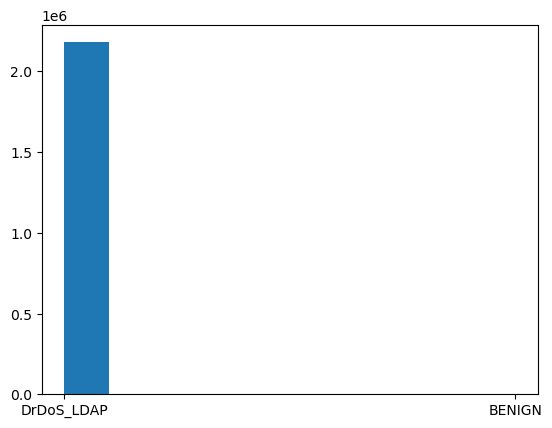

In [509]:
# Tipos de tráficos
plt.hist(x=df[columns[87]])

# df[df[columns[87]]=="DrDoS_DNS"].count(axis=0), df[df[columns[87]]=="BENIGN"].count(axis=0)


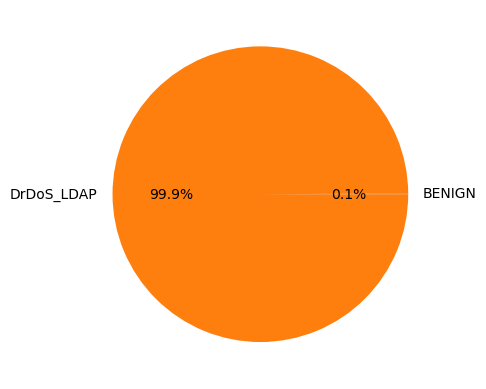

In [510]:
count_unique = np.unique(df[columns[87]], return_counts=True)
fig, ex = plt.subplots()
ex.pie(count_unique[1], labels=count_unique[0], autopct="%1.1f%%");

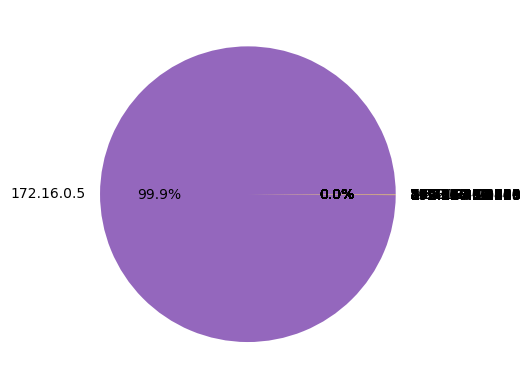

In [511]:
#  Mostrar ips
unique_ipSorce = np.unique(df[columns[2]], return_counts=True)

fig, ex = plt.subplots()
ex.pie(unique_ipSorce[1], labels=unique_ipSorce[0], autopct="%1.1f%%");


<Axes: xlabel=' Source Port', ylabel='count'>

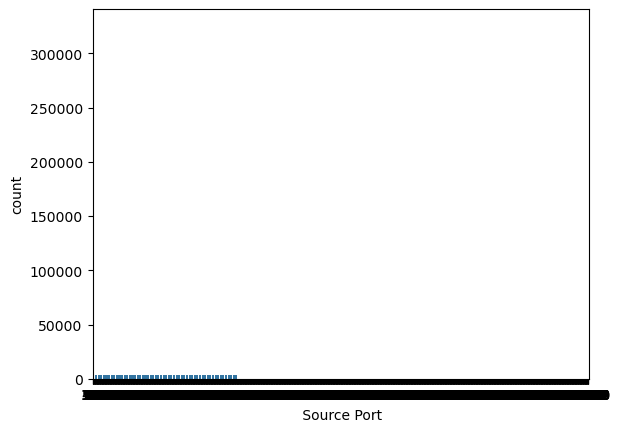

In [512]:
unique = np.unique(df[columns[3]], return_counts=True)
sns.countplot(x=df[columns[3]])

##### Fragmentação dos dados

##### Funções para tratamento dos dados

In [ ]:

def remove_inf_and_null(database, column, analysis_method="auto", important_column=False, drop_column=True):
    
    """ _summary_
    
    Args: 
        database (table): base de dados que se deseja tratar
        column (str): nome da coluna aa ser tratada
        analysis_method (str): avg - média, drop - retirar linha, auto - automático
        important_column (bool): - irá retirar toda a linha se mais de 5% dos dados da coluna for 'inf' ou 'null'
        drop_column (bool): caso a coluna seja maioria 'inf' ou 'null' retirar ela (caso não, vai deixar todos os valores como '-1')
    """
    # NORMAL FLOW
    result_df = database

    # Tratar valores infinitos
    result_df.loc[result_df[column] == np.inf, column] = result_df.loc[result_df[column] == np.inf, column].replace([np.inf], np.nan) # substituir valors infinitos por nan
    
    media_values = result_df.loc[result_df[column].notnull(),column].mean() # resgatar a média entre os valores dos dados normais
    
    if(analysis_method=="auto"):
        x = (len(result_df[result_df[column].isna()]))
        total = len(result_df[column])
        
        if(x/total <= (5/100) and important_column):
            result_df = result_df.drop(index=result_df[result_df[column].isna()].index) # retirar valores Nan  
        elif(x/total <= (40/100)):
            result_df.loc[result_df[column].isna(), column] = media_values # substituir pela média
        else:
            if(drop_column):
                result_df = result_df.drop(column, axis=1) # retirar coluna
            else:
                result_df.loc[result_df[column].isna(), column] = -1 # substituir toda coluna por -1
    elif(analysis_method=="drop"):
        result_df = result_df.drop(index=result_df[result_df[column].isna()].index) # retirar valores Nan  
    elif(analysis_method=="avg"):
        result_df.loc[result_df[column].isna(), column] = media_values # substituir pela média
        
    
    return result_df

def remove_len_zero_and_negative(database, column, type=1, analysis_method="auto", important_column=False, drop_column=True):
    """ _summary_
    
    Args: 
        database (table): base de dados que se deseja tratar
        column (str): nome da coluna aa ser tratada
        dropValues (bool): remover valores 
        typeRemove (int): 1 - both, 2 - negative, 3 - zero
        analysis_method (str): avg - média, drop - retirar linha, auto - automático
        important_column (bool): - irá retirar toda a linha se mais de 5% dos dados da coluna for '0' ou 'negativo'
        drop_column (bool): caso a coluna seja maioria '0' ou 'negativo' retirar ela (caso não, vai deixar todos os valores como '-1')
    """
    # NORMAL FLOW
    
    result_df = database

    # Tratar valores zerados ou negativos
    if(type==1):
        result_df.loc[result_df[column] <= 0, column] = result_df.loc[result_df[column] <= 0, column] = np.nan # substituir valores negativos e zerados
    elif(type==2):
        result_df.loc[result_df[column] < 0, column] = result_df.loc[result_df[column] < 0, column] = np.nan # substituir valores negativos
    elif(type==3):
        result_df.loc[result_df[column] == 0, column] = result_df.loc[result_df[column] == 0, column] = np.nan # substituir valores zerados
    
    media_values = result_df.loc[result_df[column].notnull(),column].mean() # resgatar a média entre os valores dos dados normais
    
    if(analysis_method=="auto"):
        x = (len(result_df[result_df[column].isna()]))
        total = len(result_df[column])
        
        if(x/total <= (5/100) and important_column):
            result_df = result_df.drop(index=result_df[result_df[column].isna()].index) # retirar linhas
        elif(x/total <= (40/100)):
            result_df.loc[result_df[column].isna(), column] = media_values # substituir pela média
        else:
            if(drop_column):
                result_df = result_df.drop(column, axis=1) # retirar coluna
            else:
                result_df.loc[result_df[column].isna(), column] = -1 # substituir toda coluna por -1
    elif(analysis_method=="drop"):
        result_df = result_df.drop(index=result_df[result_df[column].isna()].index) # retirar valores Nan  
    elif(analysis_method=="avg"):
        result_df.loc[result_df[column].isna(), column] = media_values # substituir pela média
        
    return result_df


def rename_duplicate_suffix(database):
    database_copy = database
    
    new_columns = []
    for col in database.columns:
        if col.endswith('.1'):
            base_name = col[:-2]
            new_columns.append(f"{base_name} (dpl)")
        else:
            new_columns.append(col)
    
    database_copy.columns = new_columns
    
    return database


###### Testes

In [514]:
data = {col: np.arange(1, 20) for col in list('ABCDEFGHIJKLMNOPQR')}

df_teste = pd.DataFrame(data)

df_teste.loc[df_teste['D'].isin((9, 7)), 'D'] = df_teste.loc[df_teste['D'].isin((9,7)), 'D'] = np.nan 
# df_teste.loc[df_teste['D']%2==0, 'D'] = df_teste.loc[df_teste['D'] % 2 == 0, 'D'] = np.nan 
# df_teste.loc[df_teste['D'].isin((5,7,9)), 'D'] = df_teste.loc[df_teste['D'].isin((5,7,9)), 'D'] = np.nan 


vn = df_teste.drop(index=df_teste[df_teste['D'].isna()].index)


# vn = remove_len_zero_and_negative(df_teste, 'D', type=2)

df_teste
vn
# ddosFlow[columns[74]].dropna(inplace=True)
# ddosFlow[columns[73]]

,A,B,C,D,E,F,G,H,I,J,K,L,M,N,O,P,Q,R
0,1,1,1,1.0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
1,2,2,2,2.0,2,2,2,2,2,2,2,2,2,2,2,2,2,2
2,3,3,3,3.0,3,3,3,3,3,3,3,3,3,3,3,3,3,3
3,4,4,4,4.0,4,4,4,4,4,4,4,4,4,4,4,4,4,4
4,5,5,5,5.0,5,5,5,5,5,5,5,5,5,5,5,5,5,5
5,6,6,6,6.0,6,6,6,6,6,6,6,6,6,6,6,6,6,6
7,8,8,8,8.0,8,8,8,8,8,8,8,8,8,8,8,8,8,8
9,10,10,10,10.0,10,10,10,10,10,10,10,10,10,10,10,10,10,10
10,11,11,11,11.0,11,11,11,11,11,11,11,11,11,11,11,11,11,11
11,12,12,12,12.0,12,12,12,12,12,12,12,12,12,12,12,12,12,12


##### Tratar a base

In [515]:
# Remover colunas duplicadas
df = rename_duplicate_suffix(df)

# Renovar nome das colunas
columns = df.columns

# Tratar da base inteira
df = remove_inf_and_null(df, columns[21])
df = remove_inf_and_null(df, columns[22])

df = remove_len_zero_and_negative(df, columns[41])
df = remove_len_zero_and_negative(df, columns[42])

df = remove_len_zero_and_negative(df, columns[73], type=2)
df = remove_len_zero_and_negative(df, columns[74], type=2)

# Renovar nome das colunas
columns = df.columns

# # Remover colunas duplicadas
# normalFlow = rename_duplicate_suffix(normalFlow) # normal flow
# ddosFlow = rename_duplicate_suffix(ddosFlow) # ddos flow

# # Renovar nome das colunas
# columns=normalFlow.columns

# # Normal Flow
# normalFlow = remove_inf_and_null(normalFlow, columns[21]) # fluxo de bytes por segundo
# normalFlow = remove_inf_and_null(normalFlow, columns[22]) # fluxo de pacotes por segundo

# normalFlow = remove_len_zero_and_negative(normalFlow, columns[41]) # comp. do cabeçalho ida
# normalFlow = remove_len_zero_and_negative(normalFlow, columns[42]) # comp. do cabeçalho volta

# normalFlow = remove_len_zero_and_negative(normalFlow, columns[73], type=2) # tam. janela inicial
# normalFlow = remove_len_zero_and_negative(normalFlow, columns[74], type=2) # tam. janela inicial

# # DDoS Flow
# ddosFlow = remove_inf_and_null(ddosFlow, columns[21]) # fluxo de bytes por segundo
# ddosFlow = remove_inf_and_null(ddosFlow, columns[22]) # fluxo de pacotes por segundo

# ddosFlow = remove_len_zero_and_negative(ddosFlow, columns[41]) # comp. do cabeçalho ida
# ddosFlow = remove_len_zero_and_negative(ddosFlow, columns[42]) # comp. do cabeçalho volta

# ddosFlow = remove_len_zero_and_negative(ddosFlow, columns[73], type=2) # tam. janela inicial
# ddosFlow = remove_len_zero_and_negative(ddosFlow, columns[74], type=2) # tam. janela inicial


In [516]:
# Separar dados com ddso e fluxo normal 
ddosFlow = df[df[columns[len(columns)-1]]==dataBaseUsed]

normalFlow = df[df[columns[len(columns)-1]]=="BENIGN"]

In [517]:
# Agrupar as bases de datas tratadas
# df_final = pd.concat([ddosFlow, normalFlow], ignore_index=True)
# df_final


###### Teste

In [518]:
# gambiarra para não precisar alterar todos os titulos e indices

# ddosFlow.insert(loc=1, column=columns[21], value=[0 for i in range(0, len(ddosFlow)) ])
# normalFlow.insert(loc=1, column=columns[21], value=[0 for i in range(0, len(normalFlow)) ])


##### Funções auxíliares

In [519]:
def get_df_unique(df_analyzed, name_column_df_analyzed, names_columns=("Value","Count"), order=1):
    uniqueDf = np.unique(df_analyzed[name_column_df_analyzed], return_counts=True)
    df_unique = pd.DataFrame({names_columns[0]:uniqueDf[0], names_columns[1]:uniqueDf[1]})
    return df_unique.sort_values(by=names_columns[order], ascending=False)

def get_df_unique_alt(df_analyzed, name_column_df_analyzed, names_columns=("Value","Count")):
    uniqueDf = np.unique(df_analyzed[name_column_df_analyzed], return_counts=True)
    df_unique = pd.DataFrame({names_columns[0]:uniqueDf[0], names_columns[1]:uniqueDf[1]})
    return df_unique

def make_graph(type_graph, table, xlabel, ylabel, figsize=(8,6), title="", limit_init=0, limit_final=500):
    """_summary_

    Args:
        type_graph (int): Gráfico que será montado (0 - hot_map | 1 - bar)
        table (dataTable): Tabela que sera usada como 
        xlabel (str): Nome do label do eixo x
        ylabel (str): Nome do label do eixo y
        figsize (tuple, optional): Tamanho padrão (largura x altura) da imagem do gráfico. Defaults to (8,6).
        title (str, optional): Titulo do gráfico. Defaults to "".
    """
    
    
    if(type_graph==0):
        hot_graph(table, xlabel, ylabel, figsize, title)
    elif(type_graph==1):
        bar_graph(table, xlabel, ylabel, figsize, title)
    elif(type_graph==2):
        pie_graph(table[xlabel], table[ylabel], title)
    elif(type_graph==3):
        bar_ddos_nrm_compare_graph(table, xlabel, title, limit_init, limit_final)
    else:
        print("type graph not find")

def pie_graph(labels_p, content, title):
    fig, ax = plt.subplots()
    ax.pie(content, labels=labels_p, autopct='%1.1f%%')
    plt.title(title)

def hot_graph(table, xlabel, ylabel, figsize_param, title):
    plt.figure(figsize=figsize_param)
    sns.heatmap(table, annot=True, cmap='viridis', fmt='d')
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.title(title)
    plt.show()

def bar_graph(table, xlabel, ylabel, figsize, title):
    
    plt.figure(figsize=figsize)
    plt.bar(table[xlabel], table[ylabel], color='skyblue')

    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)

    plt.show()

def bar_ddos_nrm_compare_graph(table, column, title, limit_init, limit_final):
    wide_df = table[[column, columns[87]]].groupby([column,columns[87]]).size().reset_index(name="Count")
    wide_df = wide_df.sort_values(by=column, ascending=True)
    wide_df[column] = [str(coluna) for coluna in wide_df[column]] # transformar coluna em string

    if((limit_final > 0 or limit_init >= 0) and limit_final > limit_init):
        wide_df = wide_df.iloc[limit_init:limit_final, :]
    
    fig = px.bar(wide_df, x=column, y="Count", color=columns[87], title=title)
    fig.show()
    
def teste():
    wide_df = df[[columns[3], columns[87]]].groupby([columns[3],columns[87]]).size().reset_index(name="Count")
    wide_df[columns[3]] = [str(coluna) for coluna in wide_df[columns[3]]]

    
    fig = px.bar(wide_df.iloc[0:100, :], x=columns[3], y="Count", color=columns[87], title="teste")
    fig.show()
    
    # print(type(wide_df[columns[3]][0]))


def analytic_data_std(data, column, names_columns, q_rangeCut, typeGraph, invert_labels=False, figSize=(8,6), nameGraph="", ignore_first_elements_range=0):
    df_analytic = get_df_unique(data, column, names_columns, order=1)
    
    if(ignore_first_elements_range > 0):
        df_analytic = df_analytic.iloc[ ignore_first_elements_range:,  : ]
    
    # Dividir a base de dados em ranges
    df_analytic[names_columns[0]] = pd.qcut(df_analytic[names_columns[0]], q=q_rangeCut)
    
    # Agrupar dados
    df_analytic = df_analytic.groupby(names_columns[0])[names_columns[1]].sum().reset_index(name=names_columns[1])
    
    df_analytic[names_columns[0]] = df_analytic[names_columns[0]].astype(str)
    
    # Construir o gráfico
    if(invert_labels):
        make_graph(typeGraph, df_analytic, names_columns[1], names_columns[2], figSize, nameGraph)
    else:
        make_graph(typeGraph, df_analytic, names_columns[0], names_columns[1], figSize, nameGraph)

##### Verificando as principais portas usadas

In [520]:
# Normal Flow

# uniqueNormalFlow = np.unique(normalFlow[columns[3]], return_counts=True)
# df_UNF = pd.DataFrame({'Port': uniqueNormalFlow[0] ,'Count': uniqueNormalFlow[1]})
# df_UNF.sort_values(by="Count", ascending=False)

# bar_ddos_nrm_compare_graph(df_UNF.iloc[0:5], df_UDF.iloc[0:5], "principais_portas_usadas", "Count", (8,6), "Principais Portas Usadas")


make_graph(3, df_final, columns[3], "Count", (20,6), "Principais portas usadas (NF)", 0, 500)
# analytic_data_std(normalFlow, columns[3], ("principais_portas_usadas","Count"), 20, 1, False, (40,8), "Principais portas usadas (NF)", 0)

IndexError: index 87 is out of bounds for axis 0 with size 84

In [ ]:
# DDoS Flow

uniqueDdosFlow = np.unique(ddosFlow[columns[3]], return_counts=True)
df_UDF = pd.DataFrame({'Port': uniqueDdosFlow[0], 'Count':uniqueDdosFlow[1]})
df_UDF.sort_values(by="Count", ascending=False)
# matrixNDF[matrixNDF["Port"]==40908]
# matrixNDF[matrixNDF["Port"]==0]


,Port,Count
394,900,324615
15,521,3813
252,758,3738
23,529,3670
73,579,3668
...,...,...
799,50146,1
801,50195,1
802,50231,1
803,50320,1


In [ ]:
# Verificar quais portas estão em comum entre as duas

# df_UDF[df_UDF["Port"].isin(df_UNF["Port"])] # Portas do DDoS flow em comum com o Normal Flow, e quantidade de pacotes ddos que foram enviadas por ela 
# df_UNF[df_UNF["Port"].isin(df_UDF["Port"])] # Portas do Normal flow em comum com o DDoS Flow, e quantidade de pacotes ddos que foram enviadas por ela

##### Verificando o protocolo usado

In [ ]:
# Fluxo normal

uniqueNormalFlow = np.unique(normalFlow[columns[6]], return_counts=True)
df_UNF = pd.DataFrame({"Protocol":uniqueNormalFlow[0] , "Count":uniqueNormalFlow[1]})
df_UNF.sort_values(by="Count")




,Protocol,Count
0,0,143
1,17,436
2,6,1033


In [ ]:
# Fluxo do DDoS

uniqueDdosFlow = np.unique(ddosFlow[columns[6]], return_counts=True)
df_UDF = pd.DataFrame({"Protocol":uniqueDdosFlow[0], "Count":uniqueDdosFlow[1]})
df_UDF.sort_values(by="Count")

,Protocol,Count
0,0,64
2,6,369
1,17,2179497


In [ ]:
# double search

make_graph(3, df, columns[6], "Count", (20,6), "protocolos usados", 0, 500)

##### Duração do fluxo 

In [ ]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[8], ("Time", "Count"))
df_UNF

,Time,Count
1,1,174
2,2,47
5,5,42
4,4,41
3,3,27
...,...,...
435,28035,1
436,28038,1
437,28051,1
438,28060,1


In [ ]:
# DDos Flow

df_UDF = get_df_unique(ddosFlow, columns[8], ("Time", "Count"))
df_UDF

,Time,Count
1,1,1388170
2,2,539945
0,0,38630
49,49,29896
48,48,22994
...,...,...
725,1060,1
726,1061,1
727,1063,1
730,1068,1


In [ ]:
# double search

make_graph(3, df_final, columns[8], "Count", (20,6), "duração do fluxo", 0,400)

##### Verificar momento de transmissão

In [ ]:
df_UNF = get_df_unique(normalFlow, columns[7], ("TimeStamp", "Count" ), order=0)
df_UNF

normalFlow[columns[7]].min(), normalFlow[columns[7]].max()


('2018-12-01 11:22:40.970628', '2018-12-01 11:32:29.693088')

In [ ]:
df_UDF = get_df_unique(ddosFlow, columns[7], ("TimeStamp", "Count" ), order=0)
df_UDF

ddosFlow[columns[7]].min(), ddosFlow[columns[7]].max()

('2018-12-01 11:22:40.254769', '2018-12-01 11:32:32.915361')

##### Analisando a qtd. total de pacotes de ida e volta

###### Ida

In [ ]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[9], ("Qtd_Total_Ida", "Count" ), order=1)
df_UNF

,Qtd_Total_Ida,Count
1,2,1009
3,4,200
2,3,114
0,1,97
5,6,42
12,14,21
4,5,19
7,8,18
14,16,13
10,12,13


In [ ]:
# QDDos  Flow

df_UDF = get_df_unique(ddosFlow, columns[9], ("Qtd_Total_Ida", "Count" ), order=1)
df_UDF

,Qtd_Total_Ida,Count
1,2,2176172
3,4,2599
7,8,813
5,6,68
0,1,56
...,...,...
45,85780,1
46,85782,1
48,85793,1
49,85795,1


In [ ]:
# Gráfico da base completa

make_graph(3, df_final, columns[9], "Count", (20,6), "Qtd total ida", 0, 500)

###### volta

In [ ]:
df_UNF = get_df_unique(normalFlow, columns[10], ("Qtd_Total_pacotes_volta", "Count" ), order=1)
df_UNF

# Divide a 'qtd total de pacotes' em 10 faixas.
# Como ele já esta contando a quantidade de vezes que a determinada quantidade de pacotes aparece,
# Então ele vai retornar um data frame em que a coluna "total_pacotes_volta" vai representar a faixa
# que determinada quantidade pertence

# df_UNF['Qtd_Total_pacotes_volta'] = pd.qcut(df_UNF["Qtd_Total_pacotes_volta"], q=10)  
# tabela = df_UNF.groupby(['Qtd_Total_pacotes_volta'])['Count'].sum().reset_index(name='Count') # Agrupar as faixas criadas somando a quantidade
# tabela["Qtd_Total_pacotes_volta"] = tabela["Qtd_Total_pacotes_volta"].astype(str) # converter a as faixas em 'string' 
# make_graph(1, tabela, "Qtd_Total_pacotes_volta", "Count", (15,6))



,Qtd_Total_pacotes_volta,Count
2,2,880
0,0,480
4,4,54
6,6,39
1,1,22
3,3,15
7,8,13
10,11,12
9,10,10
12,13,8


In [ ]:
df_UDF = get_df_unique(ddosFlow, columns[10], ("Qtd_Total_pacotes_volta", "Count" ), order=1)
df_UDF

# df_UDF["Qtd_Total_pacotes_volta"] = pd.qcut(df_UDF["Qtd_Total_pacotes_volta"],q=10)
# tabela = df_UDF.groupby(df_UDF["Qtd_Total_pacotes_volta"])["Count"].sum().reset_index(name='Count')

# tabela["Qtd_Total_pacotes_volta"] = tabela["Qtd_Total_pacotes_volta"].astype(str)
# make_graph(1, tabela.iloc[1:,:], "Qtd_Total_pacotes_volta", "Count", (15,8))


# df_UDF

,Qtd_Total_pacotes_volta,Count
0,0,2179592
2,2,157
4,4,35
13,16,28
1,1,21
6,6,16
12,14,13
11,12,11
8,8,10
3,3,8


In [ ]:
# Gráfico da base completa

make_graph(3, df_final, columns[10], "Count", (20,6), "Qtd total de pacotes volta", 0,90000)

##### Analisar tamanho do pacote

###### Ida

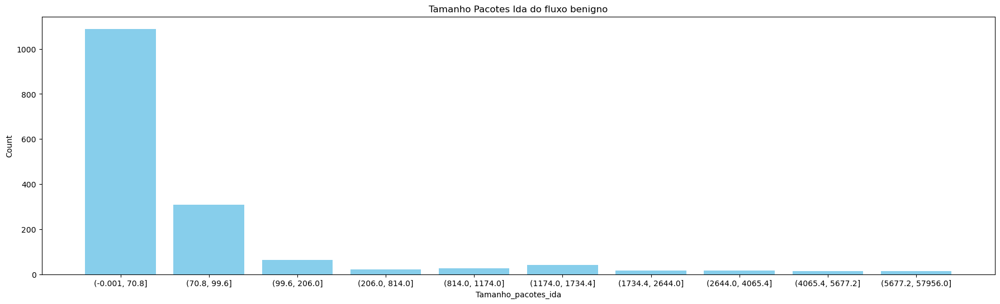

In [ ]:
# TAMANHO DOS PACOTES EM DIREÇÃO DE IDA

# normal flow
df_UNF = get_df_unique(normalFlow, columns[11], ("Tamanho_pacotes_ida","Count"), order=0)

df_UNF["Tamanho_pacotes_ida"] = pd.qcut(df_UNF["Tamanho_pacotes_ida"], q=10)
tabela = df_UNF.groupby(df_UNF["Tamanho_pacotes_ida"])["Count"].sum().reset_index(name="Count")

tabela["Tamanho_pacotes_ida"] = tabela["Tamanho_pacotes_ida"].astype(str) # Converter tamanhos para string

make_graph(1, tabela, "Tamanho_pacotes_ida", "Count", (22,6), "Tamanho Pacotes Ida do fluxo benigno")


# df_UNF

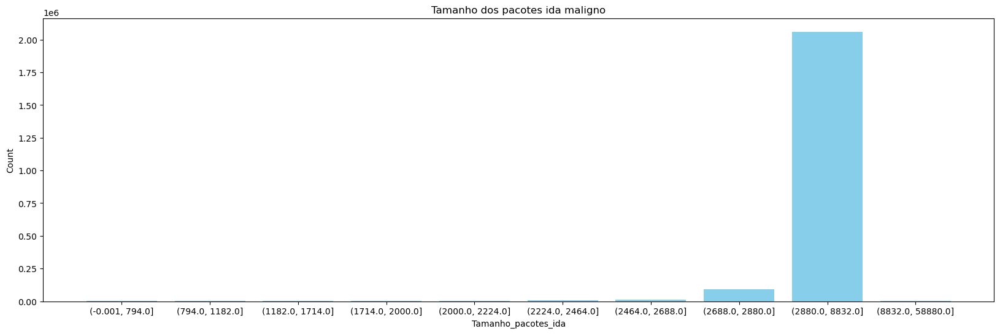

In [ ]:
# DDoS Flow

df_UDF = get_df_unique(ddosFlow, columns[11], ("Tamanho_pacotes_ida", "Count"), 1)
df_UDF["Tamanho_pacotes_ida"] = pd.qcut(df_UDF["Tamanho_pacotes_ida"], q=10)
tabela = df_UDF.groupby(df_UDF["Tamanho_pacotes_ida"])["Count"].sum().reset_index(name="Count")

tabela["Tamanho_pacotes_ida"] = tabela["Tamanho_pacotes_ida"].astype(str)
# tabela

make_graph(1,tabela, "Tamanho_pacotes_ida", "Count", (20,6), "Tamanho dos pacotes ida maligno")


In [ ]:

make_graph(3, df_final, columns[11], "Count", (20,6), "Tamanho do pacote ida", 0,2000)

###### Volta

In [ ]:
# TAMANHO DOS PACOTES NA DIREÇÃO DE VOLTA

# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[12], ("Tamanho_Total_pacotes_volta","Count"), 1)
df_UNF

# df_UNF["Tamanho_Total_pacotes_volta"] = pd.qcut(df_UNF["Tamanho_Total_pacotes_volta"], q=10)
# tabela = df_UNF.groupby(df_UNF["Tamanho_Total_pacotes_volta"])["Count"].sum().reset_index(name="Count")
# tabela["Tamanho_Total_pacotes_volta"] = tabela["Tamanho_Total_pacotes_volta"].astype(str)

# make_graph(1, tabela, "Tamanho_Total_pacotes_volta", "Count", (20,6), "Tamanho pacotes volta benigno")

,Tamanho_Total_pacotes_volta,Count
0,0.0,948
10,92.0,70
21,118.0,24
42,184.0,22
11,94.0,21
...,...,...
107,2986.0,1
106,2906.0,1
103,1708.0,1
101,1544.0,1


In [ ]:
# DDoS Flow

df_UDF = get_df_unique(ddosFlow, columns[12], ("Tamanho_Total_pacotes_volta", "Count"), 1)
df_UDF


# df_UDF["Tamanho_Total_pacotes_volta"] = pd.qcut(df_UDF["Tamanho_Total_pacotes_volta"], q=10)
# tabela = df_UDF.groupby(df_UDF["Tamanho_Total_pacotes_volta"])["Count"].sum().reset_index(name="Count")
# tabela["Tamanho_Total_pacotes_volta"] = tabela["Tamanho_Total_pacotes_volta"].astype(str)

# make_graph(1, tabela, "Tamanho_Total_pacotes_volta", "Count", (20,6), "Tamanho dos pacotes de volta maligno")

,Tamanho_Total_pacotes_volta,Count
0,0.0,2179875
20,4290.0,15
12,2146.0,14
17,3970.0,3
11,2144.0,3
2,104.0,2
19,4242.0,2
1,52.0,2
5,322.0,1
14,2698.0,1


In [ ]:
# Gráfico da base completa

make_graph(3, df_final, columns[12], "Count", (20,6), "Tamanho dos pacotes de volta", 0, 3000)

##### Comprimento (Máx./Min./Med.) dos pacotes na direção de ida

###### máximo 

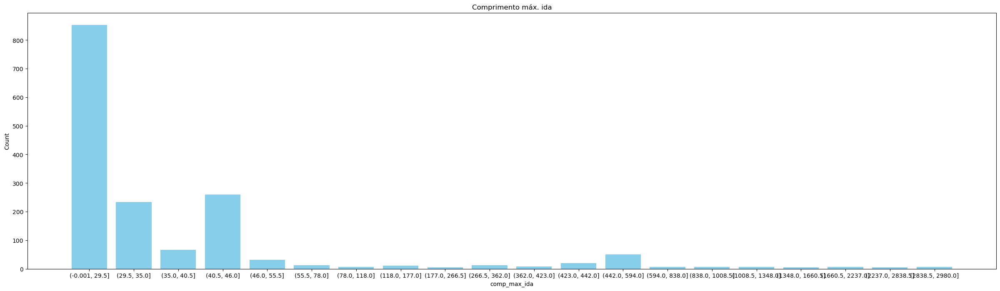

In [ ]:
# Fluxo normal

df_UNF = get_df_unique(normalFlow, columns[13], ("comp_max_ida", "Count"), 1)
df_UNF

analytic_data_std(normalFlow, columns[13], ("comp_max_ida", "Count"), 20, 1, False, (30,8), "Comprimento máx. ida")

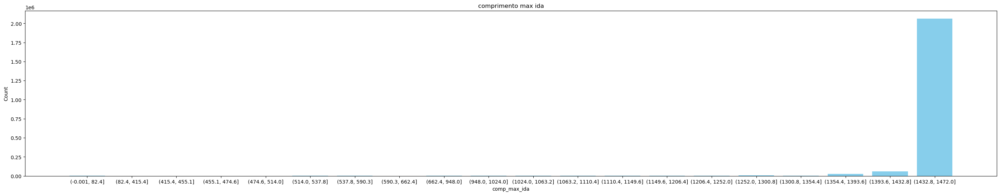

In [ ]:
# Fluxo DDoS

df_UDF = get_df_unique(ddosFlow, columns[13], ("comp_max_ida", "Count"), 1)
df_UDF["comp_max_ida"] = pd.qcut(df_UDF["comp_max_ida"], q=20)


tabela = df_UDF.groupby(df_UDF["comp_max_ida"])["Count"].sum().reset_index(name="Count")
tabela["comp_max_ida"] = tabela["comp_max_ida"].astype(str)

make_graph(1, tabela, "comp_max_ida", "Count", (35, 6), "comprimento max ida")



In [ ]:
# Gráfico da base completa

make_graph(3, df, columns[13], "Count", (20,6), "comprimento máximo dos pacotes ida", 0, 3000)

###### min

In [ ]:
# Mínimo - Normal Flow

df_UNF = get_df_unique(normalFlow, columns[14], ("Comp_Min_ida", "Count"), 1)
df_UNF

,Comp_Min_ida,Count
0,0.0,868
1,1.0,302
7,31.0,59
19,43.0,45
8,32.0,32
21,45.0,30
9,33.0,26
2,25.0,24
11,35.0,24
18,42.0,23


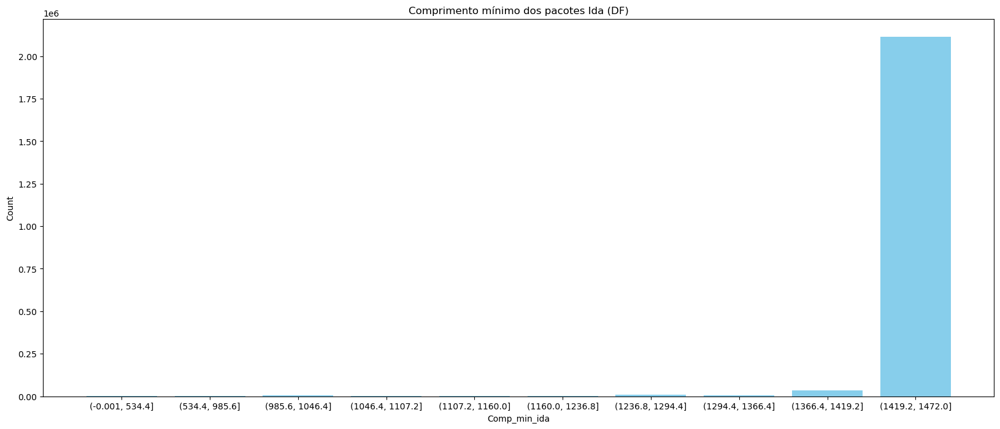

In [ ]:
# Mínimo - DDos Flow

df_UDF = get_df_unique(ddosFlow, columns[14], ("Comp_min_ida","Count"))
df_UDF

analytic_data_std(ddosFlow, columns[14], ("Comp_min_ida", "Count"), 10, 1, False, (20, 8), "Comprimento mínimo dos pacotes Ida (DF)")

In [ ]:
# Gráfico da base completa

make_graph(3, df, columns[14], "Count", (20,6), "comprimento min. ida", 0,3000)

###### Médio

In [ ]:
# Médio - normal flow

df_UNF = get_df_unique(normalFlow, columns[15], ("Comp_med_ida", "Count"), 1)
df_UNF

,Comp_med_ida,Count
0,0.000000,494
2,1.000000,302
14,23.000000,68
11,15.500000,67
23,31.000000,59
...,...,...
75,83.000000,1
74,82.500000,1
73,82.200000,1
72,79.800000,1


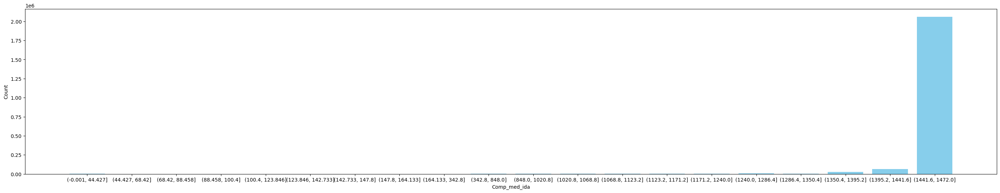

In [ ]:
# Médio - ddos flow

df_UDF = get_df_unique(ddosFlow, columns[15], ("Comp_med_ida", "Count"), 1)

df_UDF["Comp_med_ida"] = pd.qcut(df_UDF["Comp_med_ida"], q=20)
tabela = df_UDF.groupby(df_UDF["Comp_med_ida"])["Count"].sum().reset_index(name="Count")
tabela["Comp_med_ida"] = tabela["Comp_med_ida"].astype(str)

make_graph(1, tabela, "Comp_med_ida", "Count", (35,6))

In [ ]:
# Gráfico da base completa

make_graph(3, df_final, columns[15], "Count", (20,6), "Comprimento med. ida", 0,3000)

##### Comprimento (Max., Min., Med.) na direção de volta

###### Max

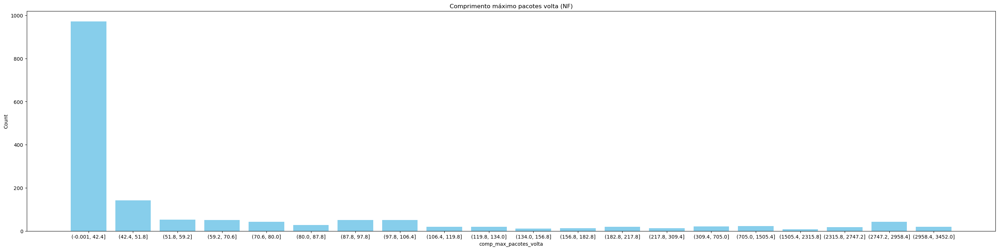

In [ ]:
# Max - Normal Flow 

# df_UNF = get_df_unique(normalFlow, columns[17], ("Comp_max_volta","Count"), 1)
# df_UNF = df_UNF.iloc[1:, :] # foi retirado o tamanho "0" que foi predominante o maior dentre eles

# df_UNF["Comp_max_volta"] = pd.qcut(df_UNF["Comp_max_volta"], q=20)
# tabela = df_UNF.groupby(df_UNF["Comp_max_volta"])["Count"].sum().reset_index(name="Count")

# tabela["Comp_max_volta"] = tabela["Comp_max_volta"].astype(str)

# make_graph(1, tabela, "Comp_max_volta", "Count", (35,6))


df_UNF = get_df_unique(normalFlow, columns[17], ("comp_max_pacotes_volta", "Count"), 1)
df_UNF

analytic_data_std(normalFlow, columns[17], ("comp_max_pacotes_volta","Count"), 20, 1, False , (35,8), "Comprimento máximo pacotes volta (NF)", 0)



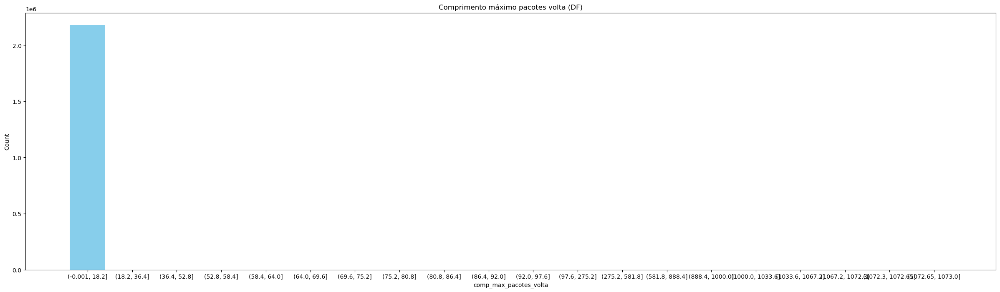

In [ ]:
# Max - DDoS Flow

# df_UDF = get_df_unique(ddosFlow, columns[17], ("Comp_max_volta", "Count"), 1)
# df_UDF = df_UDF.iloc[1:, :] # foi retirado o tamanho "0" que foi predominante o maior dentre eles

# # make_graph(1, df_UDF.iloc[1:16], "Comp_max_volta", "Count", (10,6))

# df_UDF["Comp_max_volta"] = pd.qcut(df_UDF["Comp_max_volta"], q=20)
# tabela = df_UDF.groupby(df_UDF["Comp_max_volta"])["Count"].sum().reset_index(name="Count")

# tabela["Comp_max_volta"] = tabela["Comp_max_volta"].astype(str)

# make_graph(1, tabela, "Comp_max_volta", "Count", (35,6))


df_UDF = get_df_unique(ddosFlow, columns[17], ("comp_max_pacotes_volta", "Count"), 1)
df_UDF

analytic_data_std(ddosFlow, columns[17], ("comp_max_pacotes_volta","Count"), 20, 1, False , (30,8), "Comprimento máximo pacotes volta (DF)", 0)

In [ ]:
# Gráfico da base completa

make_graph(3, df_final, columns[17], "Count", (20,6), "Comprimento máximo pacotes volta", 0, 3000)

# df_final[columns[17]]

###### Min

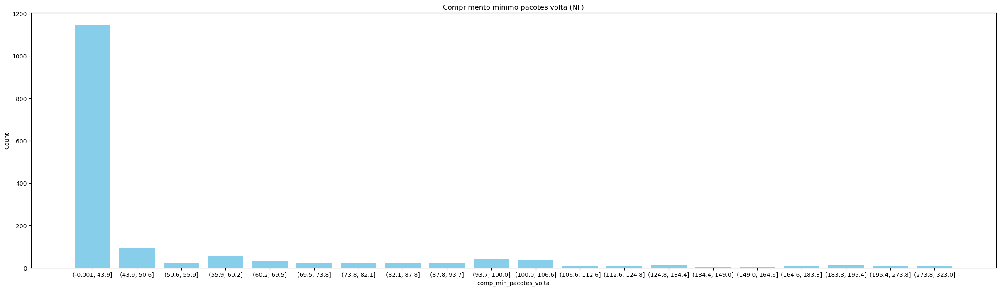

In [ ]:
# Min - Normal FLow

# df_UNF = get_df_unique(normalFlow, columns[18], ("comp_min_volta", "Count"), 1)
# df_UNF = df_UNF.iloc[1:, :] # foi retirado o tamanho "0" que foi predominante o maior dentre eles

# df_UNF["comp_min_volta"] = pd.qcut(df_UNF["comp_min_volta"], q=10)
# df_UNF = df_UNF.groupby("comp_min_volta")["Count"].sum().reset_index(name="Count")

# df_UNF["comp_min_volta"] = df_UNF["comp_min_volta"].astype(str)º

# make_graph(1,df_UNF, "comp_min_volta", "Count", (20,6), "COMP. MIN. PACOTES VOLTA - NORMAL FLOW")
# Min - DDoS Flow

df_UNF = get_df_unique(normalFlow, columns[18], ("comp_min_pacotes_volta", "Count"), 1)
df_UNF

analytic_data_std(normalFlow, columns[18], ("comp_min_pacotes_volta","Count"), 20, 1, False , (30,8), "Comprimento mínimo pacotes volta (NF)", 0)

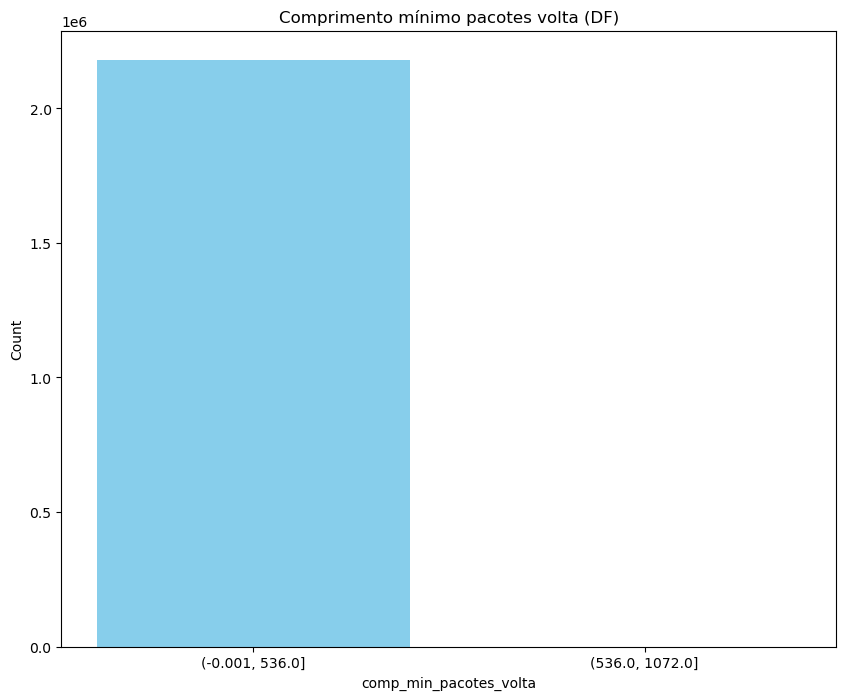

In [ ]:
# Min - DDoS Flow

df_UDF = get_df_unique(ddosFlow, columns[18], ("comp_min_pacotes_volta", "Count"), 1)
df_UDF

analytic_data_std(ddosFlow, columns[18], ("comp_min_pacotes_volta","Count"), 2, 1, False , (10,8), "Comprimento mínimo pacotes volta (DF)", 0)

In [ ]:
# Gráfico da base completa

make_graph(3, df_final, columns[18], "Count", (20,6), "Comprimento min. pacotes volta", 0, 3000)

###### Obs: nessa caso, o comprimento mínimo de mais de 99% do fluxo com DDoS, foi 0; Situação mostrada acima ^

###### Médio

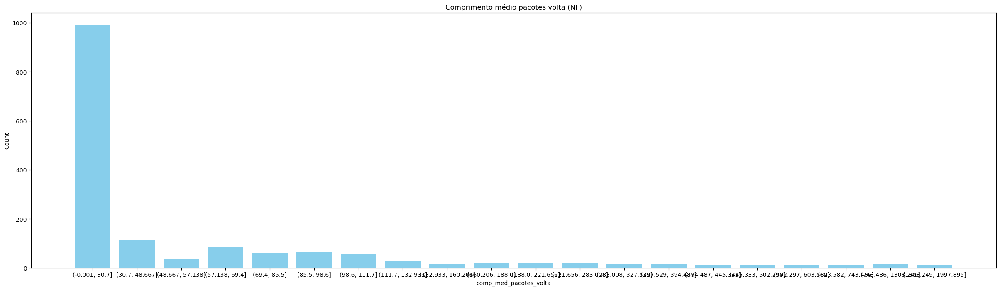

In [ ]:
# Med - Normal Flow

df_UNF = get_df_unique(normalFlow, columns[19], ("comp_med_volta", "Count"), 1)
df_UNF = df_UNF.iloc[1:, :] # Foi retirado o tamanho "0" que foi predominante o maior dentre eles

df_UNF["comp_med_volta"] = pd.qcut(df_UNF["comp_med_volta"], q=20)
df_UNF = df_UNF.groupby("comp_med_volta")["Count"].sum().reset_index(name="Count")

df_UNF["comp_med_volta"] = df_UNF["comp_med_volta"].astype(str)


# make_graph(1, df_UNF, "comp_med_volta", "Count", (37,6), "COMP. MED. PACOTES VOLTA -- NORMAL FLOW")

analytic_data_std(normalFlow, columns[19], ("comp_med_pacotes_volta","Count"), 20, 1, False , (30,8), "Comprimento médio pacotes volta (NF)", 0)




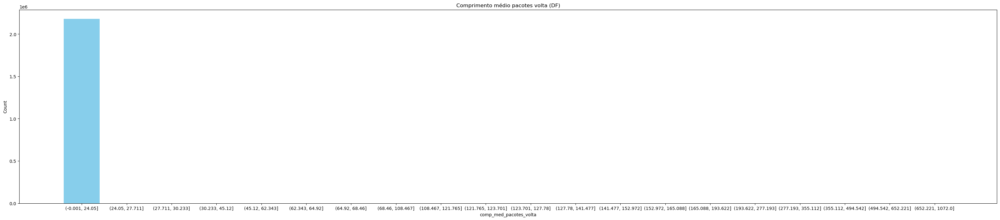

In [ ]:
# Med - DDoS Flow

df_UDF = get_df_unique(ddosFlow, columns[19], ("comp_med_volta", "Count"), 1)
df_UDF = df_UDF.iloc[1:, :] # Foi retirado o tamanho "0" que foi predominante o maior dentre eles

df_UDF["comp_med_volta"] = pd.qcut(df_UDF["comp_med_volta"], q=20)
df_UDF = df_UDF.groupby("comp_med_volta")["Count"].sum().reset_index(name="Count")

df_UDF["comp_med_volta"] = df_UDF["comp_med_volta"].astype(str)


# make_graph(1, df_UDF, "comp_med_volta", "Count", (37,6), "COMP. MED. PACOTES VOLTA -- NORMAL FLOW")

analytic_data_std(ddosFlow, columns[19], ("comp_med_pacotes_volta","Count"), 20, 1, False , (40,8), "Comprimento médio pacotes volta (DF)", 0)



In [ ]:
# Gráfico da base completa

make_graph(3, df_final, columns[19], "Count", (20,6), "Comprimento médio dos pacotes volta", 0, 3000)

##### Taxa de Fluxo

###### Em Bytes

In [ ]:
# Normal Flow

df_UNF = get_df_unique(normalFlow, columns[21], ("Taxa_fluxo_bytes", "Count"), 1)
df_UNF


# normalFlow[normalFlow[columns[21]].isna()]
# analytic_data_std(normalFlow, columns[21], ("Taxa_fluxo_bytes", "Count"), 20, 1, False, (50,8), "Taxa de fluxo de bytes p/segundo (NF)", 0)


,Taxa_fluxo_bytes,Count
0,0.000000e+00,473
1003,3.100000e+07,53
997,2.814056e+06,20
1000,1.550000e+07,6
206,7.152053e+01,4
...,...,...
364,2.172584e+03,1
365,2.259864e+03,1
366,2.347347e+03,1
367,2.359973e+03,1


In [ ]:
# DDoS Flow

df_UDF = get_df_unique(ddosFlow, columns[21], ("Taxa_fluxo_bytes", "Count"), 1)
df_UDF

# analytic_data_std(ddosFlow, columns[21], ("Taxa_fluxo_bytes", "Count"), 20, 1, False, (55,8), "Taxa de fluxo de bytes p/segundo (DF)", 0)

,Taxa_fluxo_bytes,Count
3232,2.944000e+09,1219203
3173,1.472000e+09,479539
3231,2.928000e+09,57856
3196,2.282881e+09,38630
3226,2.848000e+09,28780
...,...,...
1279,2.426374e+07,1
1277,2.419835e+07,1
1275,2.418779e+07,1
1274,2.418605e+07,1


In [ ]:
# Gráfico da base completa 
df_final[columns[21]]

make_graph(3, df_final, columns[21], "Count", (20,6), "Taxa de fluxo de bytes", 0, 4000)

###### Em pacotes

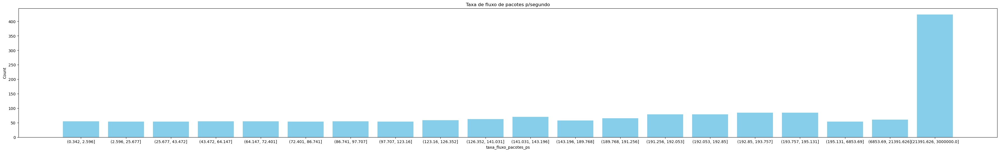

In [ ]:
# Normal Flow

df_UNF = get_df_unique(normalFlow, columns[22], ("Taxa_fluxo_pacotes_p/s", "Count"), 1)
df_UNF

analytic_data_std(normalFlow, columns[22], ("taxa_fluxo_pacotes_ps", "Count"), 20, 1, False, (45,6), "Taxa de fluxo de pacotes p/segundo", 0)


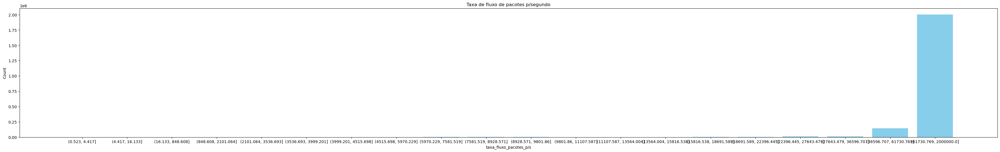

In [ ]:
df_UDF = get_df_unique(ddosFlow, columns[22], ("Taxa_fluxo_pacotes_p/s", "Count"), 1)
# len(df_UDF)

analytic_data_std(ddosFlow, columns[22], ("taxa_fluxo_pacotes_p/s", "Count"), 20, 1, False, (45,6), "Taxa de fluxo de pacotes p/segundo", 0 )

In [ ]:
# Gráfico da base completa 
normalFlow[columns[22]]

make_graph(3, df_final, columns[22], "Count", (20,6), "Taxa de fluxo de pacotes", 0,5000)

###### Tempo médio entre as chegada de pacotes 

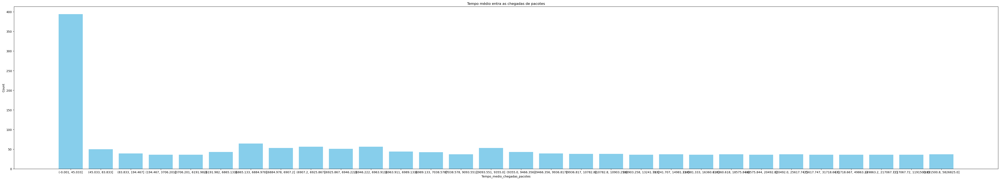

In [ ]:
# Normal flow
df_UNF = get_df_unique(normalFlow, columns[23], ("Tempo_medio_chegadas_pacotes","Count"), 1)
df_UNF

analytic_data_std(normalFlow, columns[23], ("Tempo_medio_chegadas_pacotes","Count"), 30, 1, False, (60,10), "Tempo médio entra as chegadas de pacotes", 0)

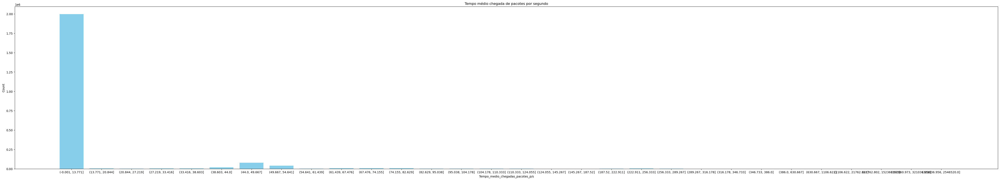

In [ ]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[23], ("Tempo_medio_chegadas_pacotes_p/s","Count"), 1)
df_UDF  

analytic_data_std(ddosFlow, columns[23], ("Tempo_medio_chegadas_pacotes_p/s","Count"), 30, 1, False, (60,10), "Tempo médio chegada de pacotes por segundo", 0)


In [ ]:
# Gráfico da base completa 
df_final[columns[23]]

make_graph(3, df_final, columns[23], "Count", (20,6), "Tempo_medio_chegadas_pacotes", 2, 3000)

###### Desvio padrão

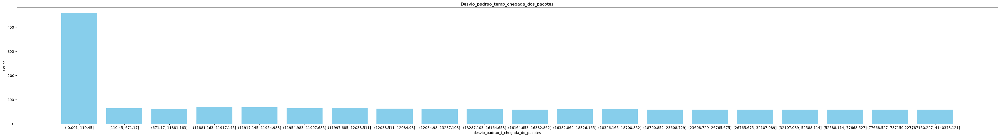

In [ ]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[24], ("desvio_padrao_t_chegada_do_pacotes", "Count"), 1)
df_UNF

analytic_data_std(normalFlow, columns[24], ("desvio_padrao_t_chegada_do_pacotes", "Count"), 20, 1, False, (50,6), "Desvio_padrao_temp_chegada_dos_pacotes", False)

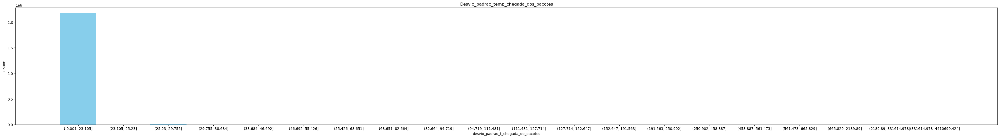

In [ ]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[24], ("desvio_padrao_t_chegada_do_pacotes", "Count" ), 1)
df_UDF
analytic_data_std(ddosFlow, columns[24], ("desvio_padrao_t_chegada_do_pacotes", "Count"), 20, 1, False, (50,6), "Desvio_padrao_temp_chegada_dos_pacotes", False)

In [ ]:
# Gráfico da base completa 
df_final[columns[24]]

make_graph(3, df_final, columns[24], "Count", (20,6), "desvio padrão do tempo de chegada dos pacotes", 0,3000)

##### Tempo entre as chegadas do pacotes

###### máximo

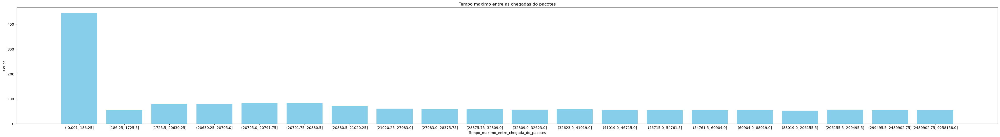

In [ ]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[25], ("Tempo_maximo_entre_chegada_do_pacotes", "Count"), 1)
df_UNF

analytic_data_std(normalFlow, columns[25], ("Tempo_maximo_entre_chegada_do_pacotes", "Count"), 20, 1, False, (50,6), "Tempo maximo entre as chegadas do pacotes", False)

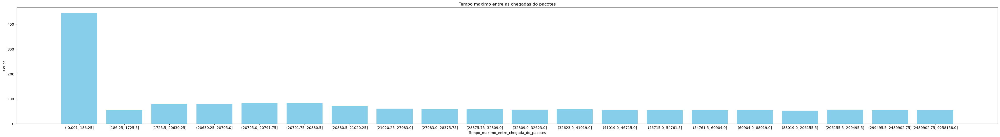

In [ ]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[25], ("Tempo_maximo_entre_chegada_do_pacotes", "Count"), 1)
# df_UDF

analytic_data_std(normalFlow, columns[25], ("Tempo_maximo_entre_chegada_do_pacotes", "Count"), 20, 1, False, (50,6), "Tempo maximo entre as chegadas do pacotes", False)

In [ ]:
# Gráfico da base completa 
df_final[columns[25]]

make_graph(3, df_final, columns[25], "Count", (20,6), "Tempo maximo entre as chegadas do pacotes", 0, 1000)

###### Mínimo


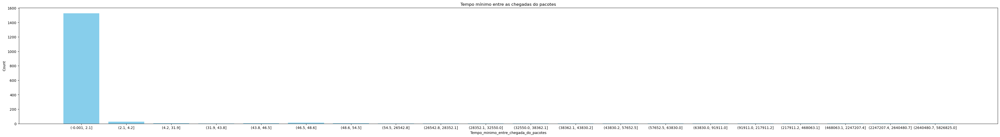

In [ ]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[26], ("Tempo_minimo_entre_chegada_do_pacotes", "Count"), 1)
df_UNF

analytic_data_std(normalFlow, columns[26], ("Tempo_minimo_entre_chegada_do_pacotes", "Count"), 20, 1, False, (50,6), "Tempo mínimo entre as chegadas do pacotes", False)

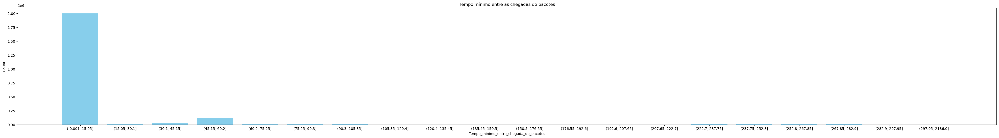

In [ ]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[26], ("Tempo_minimo_entre_chegada_do_pacotes", "Count"), 1)
df_UDF

analytic_data_std(ddosFlow, columns[26], ("Tempo_minimo_entre_chegada_do_pacotes", "Count"), 20, 1, False, (50,6), "Tempo mínimo entre as chegadas do pacotes", False)

In [ ]:
# Gráfico da base completa 
df_final[columns[26]]

make_graph(3, df_final, columns[26], "Count", (20,6), "Tempo mínimo entre as chegadas do pacotes", 0, 3000)

###### Total

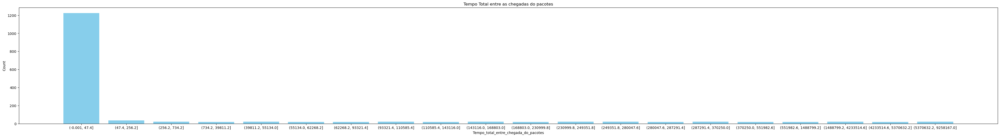

In [ ]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[27], ("Tempo_total_entre_chegada_do_pacotes", "Count"), 1)
df_UNF

analytic_data_std(normalFlow, columns[27], ("Tempo_total_entre_chegada_do_pacotes", "Count"), 20, 1, False, (50,6), "Tempo Total entre as chegadas do pacotes", False)

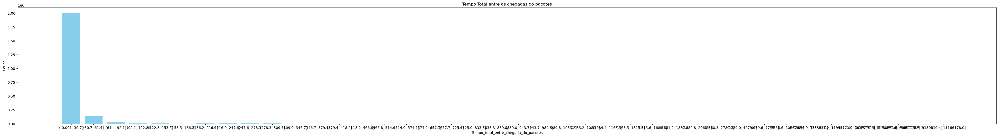

In [ ]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[27], ("Tempo_total_entre_chegada_do_pacotes", "Count"), 1)
df_UDF

analytic_data_std(ddosFlow, columns[27], ("Tempo_total_entre_chegada_do_pacotes", "Count"), 40, 1, False, (50,6), "Tempo Total entre as chegadas do pacotes", 0)

In [ ]:
# Gráfico da base completa 
df_final[columns[27]]

make_graph(3, df_final, columns[27], "Count", (20,6), "Tempo total entre as chegadas do pacotes", 0, 3000)

###### Medio

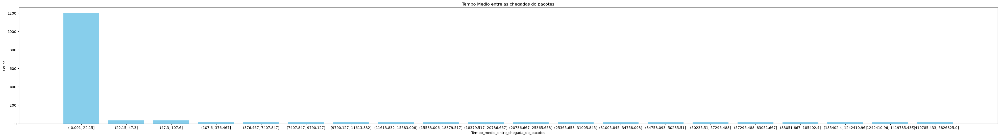

In [ ]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[28], ("Tempo_medio_entre_chegada_do_pacotes", "Count"), 1)
df_UNF
analytic_data_std(normalFlow, columns[28], ("Tempo_medio_entre_chegada_do_pacotes", "Count"), 20, 1, False, (50,6), "Tempo Medio entre as chegadas do pacotes", False)

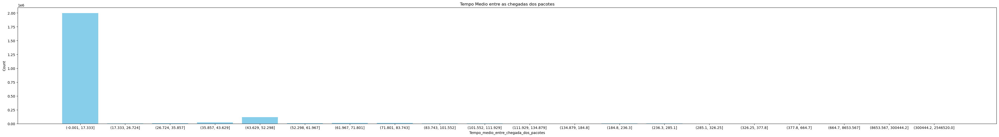

In [ ]:
# Normal Flow
df_UDF = get_df_unique(ddosFlow, columns[28], ("Tempo_medio_entre_chegada_dos_pacotes", "Count"), 1)
df_UDF

analytic_data_std(ddosFlow, columns[28], ("Tempo_medio_entre_chegada_dos_pacotes", "Count"), 20, 1, False, (50,6), "Tempo Medio entre as chegadas dos pacotes", False)

In [ ]:
# Gráfico da base completa 
df_final[columns[28]]

make_graph(3, df_final, columns[28], "Count", (20,6), "Tempo médio entre as chegadas do pacotes", 0, 5000)

##### Tempo entre as chegadas dos pacotes Ida

###### Maximo

In [ ]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[30], ("Tempo_maximo_entre_chegada_dos_pacotes_ida", "Count"), 1)
df_UNF
# analytic_data_std(normalFlow, columns[30], ("Tempo_maximo_entre_chegada_dos_pacotes_ida", "Count"), 20, 1, False, (50,6), "Tempo Maximo entre as chegadas do pacotes Ida", False)

,Tempo_maximo_entre_chegada_dos_pacotes_ida,Count
1,1.0,582
2,2.0,311
3,3.0,131
0,0.0,130
4,4.0,34
...,...,...
135,62172.0,1
134,62126.0,1
133,62124.0,1
132,62117.0,1


In [ ]:
# DDos Flow
df_UDF = get_df_unique(ddosFlow, columns[30], ("Tempo_maximo_entre_chegada_dos_pacotes_ida", "Count"), 1)
df_UDF
# analytic_data_std(ddosFlow, columns[30], ("Tempo_maximo_entre_chegada_dos_pacotes_ida", "Count"), 20, 1, False, (50,6), "Tempo Maximo entre as chegadas do pacotes Ida", False)

,Tempo_maximo_entre_chegada_dos_pacotes_ida,Count
1,1.0,1388220
2,2.0,540038
0,0.0,38688
49,49.0,30043
48,48.0,23096
...,...,...
606,953.0,1
610,957.0,1
611,958.0,1
612,960.0,1


In [ ]:
# Gráfico da base completa 
df_final[columns[30]]

make_graph(3, df_final, columns[30], "Count", (20,6), "Tempo máximo entre as chegadas do pacotes IDA", 0, 3000)

In [ ]:
# Gráfico da base completa 
df_final[columns[28]]

make_graph(3, df_final, columns[28], "Count", (20,6), "Tempo médio entre as chegadas do pacotes", 0, 500)

###### Minimo

In [ ]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[31], ("Tempo_minimo_entre_chegada_dos_pacotes_ida", "Count"), 1)
df_UNF
# analytic_data_std(normalFlow, columns[31], ("Tempo_minimo_entre_chegada_dos_pacotes_ida", "Count"), 20, 1, False, (50,6), "Tempo mínimo entre as chegadas do pacotes Ida", False)

,Tempo_minimo_entre_chegada_dos_pacotes_ida,Count
1,1.0,941
2,2.0,312
0,0.0,224
3,3.0,70
14,46.0,9
16,48.0,9
4,4.0,6
15,47.0,5
5,5.0,4
18,50.0,4


In [ ]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[31], ("Tempo_minimo_entre_chegada_dos_pacotes_ida", "Count"), 1)
df_UDF
# analytic_data_std(ddosFlow, columns[31], ("Tempo_minimo_entre_chegada_dos_pacotes_ida", "Count"), 20, 1, False, (50,6), "Tempo mínimo entre as chegadas do pacotes Ida", False)

,Tempo_minimo_entre_chegada_dos_pacotes_ida,Count
1,1.0,1391245
2,2.0,540170
0,0.0,39092
49,49.0,29854
48,48.0,22981
...,...,...
166,177.0,1
167,178.0,1
170,182.0,1
171,183.0,1


In [ ]:
# Gráfico da base completa 
df_final[columns[31]]

make_graph(3, df_final, columns[31], "Count", (20,6), "Tempo mínimo entre as chegadas do pacotes IDA", 0, 3000)

###### Medio

In [ ]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[33], ("Tempo_medio_entre_chegada_dos_pacotes_ida", "Count"), 1)
df_UNF
# analytic_data_std(normalFlow, columns[33], ("Tempo_medio_entre_chegada_dos_pacotes_ida", "Count"), 20, 1, False, (50,6), "Tempo medio entre as chegadas do pacotes Ida", False)

,Tempo_medio_entre_chegada_dos_pacotes_ida,Count
0,0.000000e+00,518
2,1.000000e+00,466
5,2.000000e+00,227
24,4.800000e+01,36
6,3.000000e+00,34
...,...,...
96,7.598261e+03,1
97,7.649235e+03,1
98,7.926824e+03,1
99,8.009231e+03,1


In [ ]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[33], ("Tempo_medio_entre_chegada_dos_pacotes_ida", "Count"), 1)
df_UDF
# analytic_data_std(ddosFlow, columns[33], ("Tempo_medio_entre_chegada_dos_pacotes_ida", "Count"), 20, 1, False, (50,6), "Tempo medio entre as chegadas do pacotes Ida", False)

,Tempo_medio_entre_chegada_dos_pacotes_ida,Count
0,0.000000e+00,2179621
1,1.000000e+00,108
3,2.000000e+00,29
8,4.600000e+01,3
4,3.000000e+00,2
...,...,...
60,2.495093e+05,1
61,2.496707e+05,1
62,2.499580e+05,1
63,2.499657e+05,1


In [ ]:
# Gráfico da base completa 
df_final[columns[33]]

make_graph(3, df_final, columns[33], "Count", (20,6), "Tempo médio entre as chegadas do pacotes IDA", 0, 1000)

##### Tempo entre as chegadas dos pacotes volta

###### maximo

In [ ]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[35], ("Tempo_maximo_entre_chegada_dos_pacotes_volta", "Count"), 1)
df_UNF
# analytic_data_std(normalFlow, columns[35], ("Tempo_maximo_entre_chegada_dos_pacotes_volta", "Count"), 20, 1, False, (50,6), "Tempo maximo entre as chegadas do pacotes volta", False)

,Tempo_maximo_entre_chegada_dos_pacotes_volta,Count
0,0.0,518
1,1.0,465
2,2.0,235
16,48.0,37
3,3.0,36
...,...,...
91,43718.0,1
92,44161.0,1
93,44357.0,1
94,44630.0,1


In [ ]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[35], ("Tempo_maximo_entre_chegada_dos_pacotes_volta", "Count"), 1)
df_UDF
# analytic_data_std(ddosFlow, columns[35], ("Tempo_maximo_entre_chegada_dos_pacotes_volta", "Count"), 20, 1, False, (50,6), "Tempo maximo entre as chegadas do pacotes volta", False)

,Tempo_maximo_entre_chegada_dos_pacotes_volta,Count
0,0.0,2179621
1,1.0,108
2,2.0,30
7,46.0,3
161,5975659.0,2
...,...,...
59,764169.0,1
60,764236.0,1
61,765365.0,1
62,765559.0,1


In [ ]:
# Gráfico da base completa 
df_final[columns[35]]

make_graph(3, df_final, columns[35], "Count", (20,6), "Tempo médio entre as chegadas do pacotes VOLTA", 0, 3000)

###### minimo

In [ ]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[36], ("Tempo_minimo_entre_chegada_dos_pacotes_volta", "Count"), 1)
df_UNF
# analytic_data_std(normalFlow, columns[36], ("Tempo_minimo_entre_chegada_dos_pacotes_volta", "Count"), 20, 1, False, (50,6), "Tempo minimo entre as chegadas do pacotes volta", False)

,Tempo_minimo_entre_chegada_dos_pacotes_volta,Count
1,1.0,615
0,0.0,564
2,2.0,240
3,3.0,40
16,48.0,36
15,47.0,31
17,49.0,17
14,46.0,14
4,4.0,10
18,50.0,6


In [ ]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[36], ("Tempo_minimo_entre_chegada_dos_pacotes_volta", "Count"), 1)
df_UDF
# analytic_data_std(ddosFlow, columns[36], ("Tempo_minimo_entre_chegada_dos_pacotes_volta", "Count"), 20, 1, False, (50,6), "Tempo minimo entre as chegadas do pacotes volta", False)

,Tempo_minimo_entre_chegada_dos_pacotes_volta,Count
0,0.0,2179656
1,1.0,221
2,2.0,37
8,46.0,4
3,3.0,2
4,4.0,1
5,7.0,1
6,43.0,1
7,44.0,1
9,47.0,1


In [ ]:
# Gráfico da base completa 
df_final[columns[36]]

make_graph(3, df_final, columns[36], "Count", (20,6), "Tempo mínimo entre as chegadas do pacotes VOLTA", 0, 3000)

###### medio

In [ ]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[33], ("Tempo_medio_entre_chegada_dos_pacotes_volta", "Count"), 1)
df_UNF
# analytic_data_std(normalFlow, columns[34], ("Tempo_medio_entre_chegada_dos_pacotes_volta", "Count"), 20, 1, False, (50,6), "Tempo medio entre as chegadas do pacotes volta", False)

,Tempo_medio_entre_chegada_dos_pacotes_volta,Count
0,0.000000e+00,518
2,1.000000e+00,466
5,2.000000e+00,227
24,4.800000e+01,36
6,3.000000e+00,34
...,...,...
96,7.598261e+03,1
97,7.649235e+03,1
98,7.926824e+03,1
99,8.009231e+03,1


In [ ]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[33], ("Tempo_medio_entre_chegada_dos_pacotes_volta", "Count"), 1)
df_UDF
# analytic_data_std(ddosFlow, columns[34], ("Tempo_medio_entre_chegada_dos_pacotes_volta", "Count"), 20, 1, False, (50,6), "Tempo medio entre as chegadas do pacotes volta", False)

,Tempo_medio_entre_chegada_dos_pacotes_volta,Count
0,0.000000e+00,2179621
1,1.000000e+00,108
3,2.000000e+00,29
8,4.600000e+01,3
4,3.000000e+00,2
...,...,...
60,2.495093e+05,1
61,2.496707e+05,1
62,2.499580e+05,1
63,2.499657e+05,1


In [ ]:
# Gráfico da base completa 
df_final[columns[33]]

make_graph(3, df_final, columns[33], "Count", (20,6), "Tempo médio entre as chegadas do pacotes VOLTA", 0, 3000)

##### Flags PSH

###### Ida

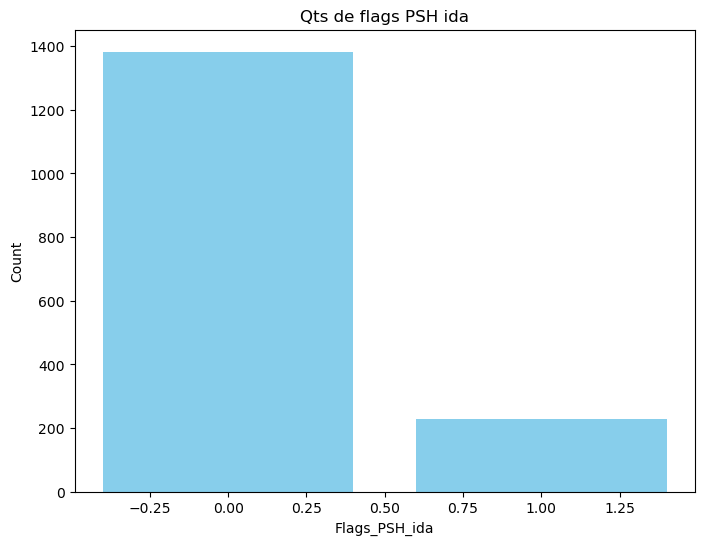

In [ ]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[37], ("Flags_PSH_ida","Count"),1)
df_UNF

df_UNF = make_graph(1, df_UNF, "Flags_PSH_ida", "Count", (8,6), "Qts de flags PSH ida")

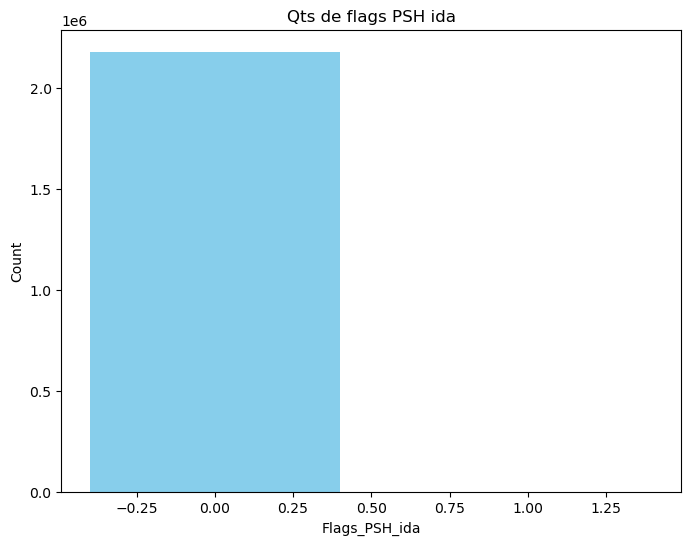

In [ ]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[37], ("Flags_PSH_ida","Count"),1)
df_UDF

df_UDF = make_graph(1, df_UDF, "Flags_PSH_ida", "Count", (8,6), "Qts de flags PSH ida")

In [ ]:
# Gráfico da base completa 
df_final[columns[37]]

make_graph(3, df_final, columns[37], "Count", (20,6), "FLAGS PSH IDA", 0, 3000)

###### Volta

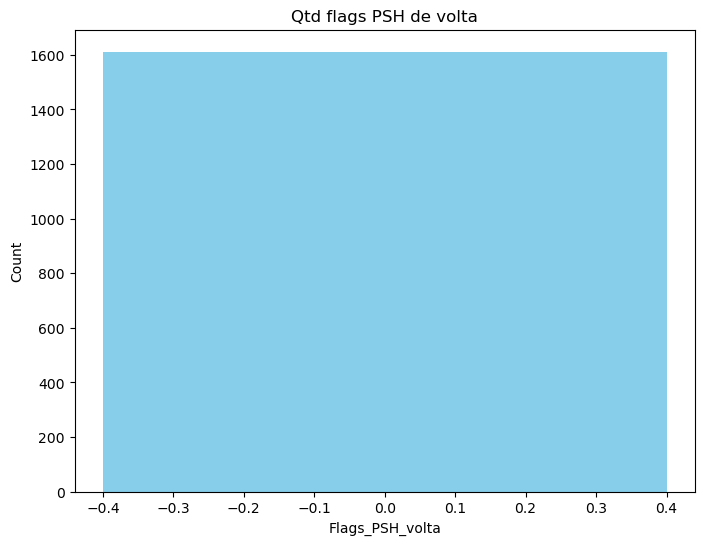

In [ ]:
# Normal Flow

df_UNF = get_df_unique(normalFlow, columns[38], ("Flags_PSH_volta", "Count"), 1)
df_UNF

make_graph(1, df_UNF, "Flags_PSH_volta", "Count", (8,6), "Qtd flags PSH de volta")

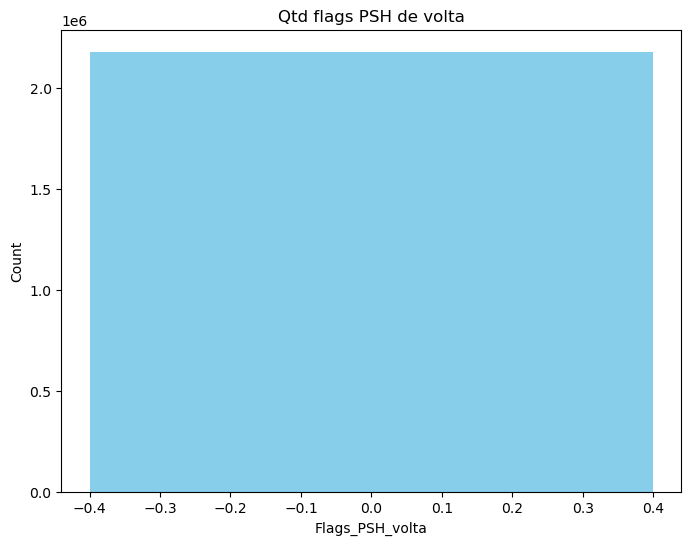

In [ ]:
# DDoS Flow

df_UDF = get_df_unique(ddosFlow, columns[38], ("Flags_PSH_volta", "Count"), 1)
df_UDF

make_graph(1, df_UDF, "Flags_PSH_volta", "Count", (8,6), "Qtd flags PSH de volta")

In [ ]:
# Gráfico da base completa 
df_final[columns[38]]

make_graph(3, df_final, columns[38], "Count", (20,6), "FLAG PSH VOLTA", 0, 3000)

##### Flag URG

###### Ida

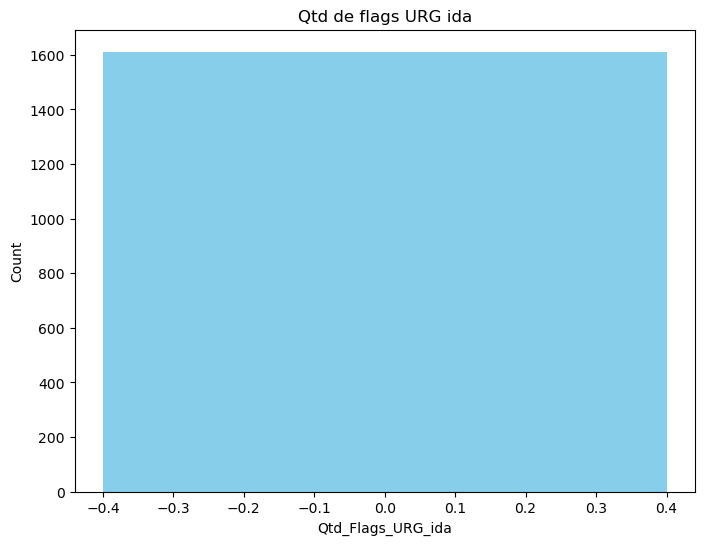

In [ ]:
df_UNF = get_df_unique(normalFlow, columns[39], ("Qtd_Flags_URG_ida","Count"), 1)
df_UNF

make_graph(1, df_UNF, "Qtd_Flags_URG_ida", "Count", (8,6), "Qtd de flags URG ida")

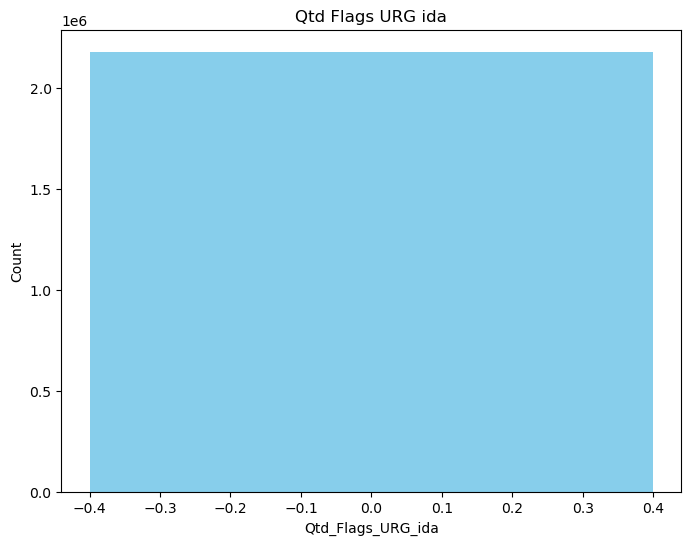

In [ ]:
# DDoS Flow

df_UDF = get_df_unique(ddosFlow, columns[39], ("Qtd_Flags_URG_ida", "Count"), 1)
df_UDF

make_graph(1, df_UDF, "Qtd_Flags_URG_ida", "Count", (8,6), "Qtd Flags URG ida")


In [ ]:
# Gráfico da base completa 
df_final[columns[39]]

make_graph(3, df_final, columns[39], "Count", (20,6), "FLAG URG IDA", 0, 1000)

###### Volta

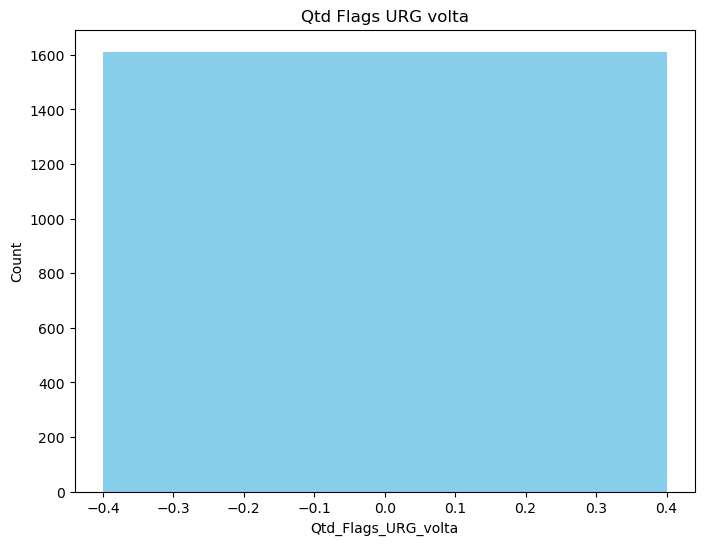

In [ ]:
# Normal Flow

df_UNF = get_df_unique(normalFlow, columns[40], ("Qtd_Flags_URG_volta","Count"), 1)
df_UNF

make_graph(1, df_UNF, "Qtd_Flags_URG_volta", "Count", (8,6), "Qtd Flags URG volta")

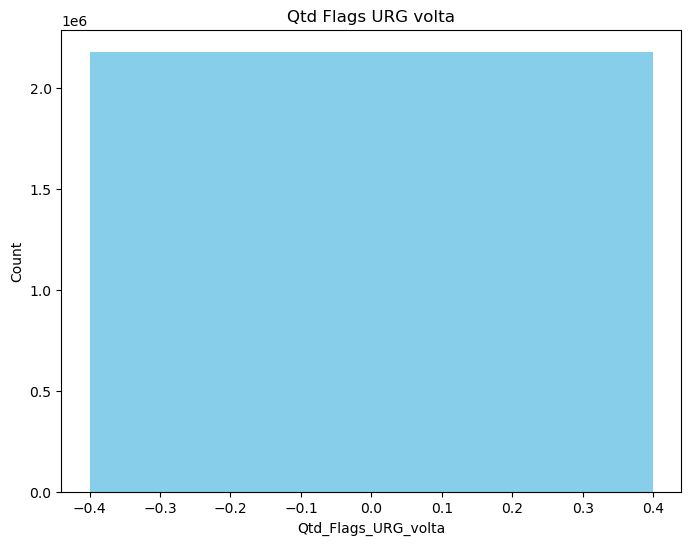

In [ ]:
# DDoS Flow

df_UDF = get_df_unique(ddosFlow, columns[40], ("Qtd_Flags_URG_volta","Count"), 1)
df_UDF

make_graph(1, df_UDF, "Qtd_Flags_URG_volta", "Count", (8,6), "Qtd Flags URG volta")

In [ ]:
# Gráfico da base completa 
df_final[columns[40]]

make_graph(3, df_final, columns[40], "Count", (20,6), "FLAG URG VOLTA", 0, 1000)

##### Comprimento dos cabeçalhos

###### ida

In [521]:
# Normal FLow

df_UNF = get_df_unique(normalFlow, columns[41], ("comp_cabecalhos_ida","Count"), 1)
df_UNF = df_UNF[df_UNF["comp_cabecalhos_ida"] > 0]
df_UNF

# analytic_data_std(normalFlow, columns[41], ("comp_cabecalhos_ida", "Count"), 20, 1, False, (40,6), "comp_cabecalhos_ida")

,comp_cabecalhos_ida,Count
1079,2.000000e+06,170
1077,1.000000e+06,59
1076,8.000000e+05,31
1075,7.500000e+05,31
1074,6.666667e+05,22
...,...,...
376,4.912677e+01,1
377,4.931210e+01,1
378,4.953519e+01,1
379,5.000444e+01,1


In [441]:
# DDoS FLow

normalFlow.columns[41]
ddosFlow.columns[41]

# df_UDF = get_df_unique(ddosFlow, columns[41], ("comp_cabecalhos_ida","Count"), 1)
# df_UDF = df_UDF[df_UDF["comp_cabecalhos_ida"] > 0]
# df_UDF

# analytic_data_std(ddosFlow, columns[41], ("comp_cabecalhos_ida", "Count"), 10, 1, False, (30,6), "comp_cabecalhos_ida")

# ddosFlow.columns
# columns[41]

'Fwd Packets/s'

In [145]:
# Gráfico da base completa 

make_graph(3, normalFlow ,columns[41], "Count", (20,6), "COMPRIMENTO DOS CABEÇALHOS IDA", 0, 3000)

In [146]:
# Gráfico da base completa 

make_graph(3, ddosFlow, column_teste, "Count", (20,6), "COMPRIMENTO DOS CABEÇALHOS IDA", 0, 3000)

###### volta

In [147]:
# Normal FLow

df_UNF = get_df_unique(normalFlow, columns[42], ("comp_cabecalhos_volta","Count"), 1)
df_UNF = df_UNF[df_UNF["comp_cabecalhos_volta"] > 0]
df_UNF

# analytic_data_std(normalFlow, columns[42], ("comp_cabecalhos_volta", "Count"), 20, 1, False, (40,6), "comp cabecalhos volta")

,comp_cabecalhos_volta,Count
15,159.684608,553
3,40.000000,392
5,64.000000,355
6,80.000000,47
1,20.000000,22
...,...,...
40,424.000000,1
37,380.000000,1
23,228.000000,1
27,268.000000,1


In [ ]:
# DDoS FLow

df_UDF = get_df_unique(ddosFlow, columns[42], ("comp_cabecalhos_volta","Count"), 1)
df_UDF = df_UDF[df_UDF["comp_cabecalhos_volta"] > 0]
df_UDF

# analytic_data_std(ddosFlow, columns[42], ("comp_cabecalhos_volta", "Count"), 20, 1, False, (40,6), "comp cabecalhos volta")

In [136]:
# Gráfico da base completa 
df_final[columns[42]]

make_graph(3, df_final, columns[42], "Count", (20,6), "Comprimento dos cabeçalhos VOLTA", 0, 3000)

In [162]:
df[df[columns[87]]!="DrDoS_LDAP"][columns[42]]

2389       64
6050        0
13522       0
30496       0
34745      64
           ..
2151050    40
2151051    40
2151052    40
2156756     0
2170380     0
Name:  Bwd Header Length, Length: 1612, dtype: int64

##### Pacotes p/ segundos

###### ida

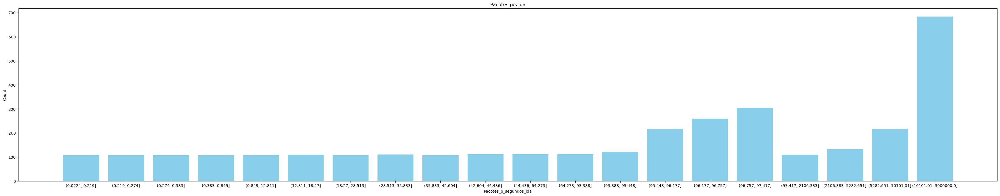

In [ ]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[43], ("pacotes_p_segundo_ida","Count"), 1)
df_UNF

analytic_data_std(normalFlow, columns[43], ("Pacotes_p_segundos_ida", "Count"), 20, 1, False, (45,8), "Pacotes p/s ida", 0)

In [128]:
# Gráfico da base completa 
df_final[columns[43]]

make_graph(3, df_final, columns[43], "Count", (20,6), "Pacotes p/s IDA", 0, 1000)

###### volta

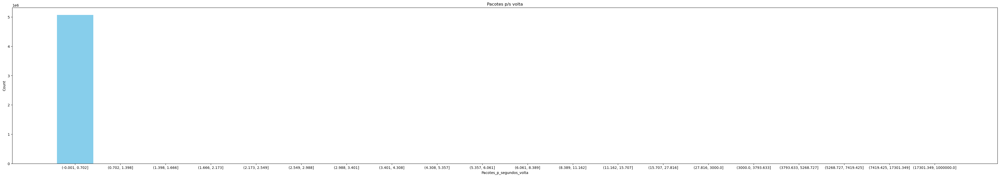

In [126]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[44], ("pacotes_p_segundo_volta","Count"), 1)
df_UDF

analytic_data_std(ddosFlow, columns[44], ("Pacotes_p_segundos_volta", "Count"), 20, 1, False, (50,8), "Pacotes p/s volta", 0)

In [127]:
# Gráfico da base completa 
df_final[columns[44]]

make_graph(3, df_final, columns[44], "Count", (20,6), "Pacotes p/s VOLTA", 0, 1000)

##### Comp. pacotes no fluxo

###### máximo

In [ ]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[46], ("Comp_pacotes_fluxo_max", "Count"), 1)
df_UNF 

# analytic_data_std(normalFlow, columns[46], ("Comp_pacotes_fluxo_max","Count"), 20, 1, False, (40, 8), "Comp. pacotes no fluxo máximo (NF)", 0)

,Comp_pacotes_fluxo_max,Count
0,0.0,1184
12,46.0,263
3,31.0,164
1,1.0,126
205,2860.0,77
...,...,...
168,1016.0,1
167,1008.0,1
166,1000.0,1
165,965.0,1


In [ ]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[46], ("Comp_pacotes_fluxo_max", "Count"), 1)
df_UDF 

# analytic_data_std(ddosFlow, columns[46], ("Comp_pacotes_fluxo_max","Count"), 20, 1, False, (40, 8), "Comp. pacotes no fluxo máximo (DF)", 0)

,Comp_pacotes_fluxo_max,Count
1440,1472.0,3525468
1416,1448.0,590706
1432,1464.0,161220
1385,1416.0,44498
1393,1424.0,43479
...,...,...
1332,1363.0,1
934,958.0,1
1413,1444.0,1
812,834.0,1


In [130]:
# Gráfico da base completa 
df_final[columns[46]]

make_graph(3, df_final, columns[46], "Count", (20,6), "Comprimento máx pacotes no fluxo", 0, 1000)

###### mínimo

In [ ]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[45], ("Comp_pacotes_fluxo_min", "Count"), 1)
df_UNF 

# analytic_data_std(normalFlow, columns[45], ("Comp_pacotes_fluxo_min","Count"), 20, 1, False, (40, 8), "Comp. pacotes no fluxo mínimo (NF)", 0)

,Comp_pacotes_fluxo_min,Count
0,0.0,2194
19,43.0,137
7,31.0,117
14,38.0,86
8,32.0,81
18,42.0,73
26,50.0,60
21,45.0,57
2,25.0,57
13,37.0,54


In [ ]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[45], ("Comp_pacotes_fluxo_min", "Count"), 1)
df_UDF 

# analytic_data_std(ddosFlow, columns[45], ("Comp_pacotes_fluxo_min","Count"), 20, 1, False, (40, 8), "Comp. pacotes no fluxo mínimo (DF)", 0)

,Comp_pacotes_fluxo_min,Count
1440,1472.0,3525361
1416,1448.0,590706
1432,1464.0,161209
1385,1416.0,44498
1393,1424.0,43474
...,...,...
1257,1285.0,1
208,230.0,1
1123,1149.0,1
1332,1363.0,1


In [131]:
# Gráfico da base completa 
df_final[columns[45]]

make_graph(3, df_final, columns[45], "Count", (20,6), "Comprimento mínimo  pacotes no fluxo", 0, 1000)

###### médio

In [ ]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[47], ("Comp_pacotes_fluxo_med", "Count"), 1)
df_UNF 

analytic_data_std(normalFlow, columns[47], ("Comp_pacotes_fluxo_med","Count"), 20, 1, False, (40, 8), "Comp. pacotes no fluxo médio (NF)", 0)

,Comp_pacotes_fluxo_med,Count
0,0.000000,1184
36,20.666667,122
7,0.600000,93
68,33.800000,75
106,49.400000,54
...,...,...
295,120.044944,1
294,119.354839,1
1,0.485714,1
292,117.600000,1


In [133]:
# DDOs Flow
df_UDF = get_df_unique(ddosFlow, columns[47], ("Comp_pacotes_fluxo_med", "Count"), 1)
df_UDF 

# analytic_data_std(ddosFlow, columns[48], ("Comp_pacotes_fluxo_med","Count"), 20, 1, False, (40, 8), "Comp. pacotes no fluxo médio (DF)", 0)

,Comp_pacotes_fluxo_med,Count
1817,1472.000000,3643128
1791,1448.000000,611652
1809,1464.000000,166769
1758,1416.000000,46314
1766,1424.000000,45136
...,...,...
394,213.600000,1
392,212.072727,1
387,209.888889,1
386,209.750000,1


In [134]:
# Gráfico da base completa 
df_final[columns[47]]

make_graph(3, df_final, columns[47], "Count", (20,6), "Comprimento médio pacotes no fluxo", 0, 1000)

###### desvio padrao

In [ ]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[48], ("Comp_pacotes_fluxo_desvio_padrao", "Count"), 0)
df_UNF 

# analytic_data_std(normalFlow, columns[48], ("Comp_pacotes_fluxo_desvio_padrao","Count"), 20, 1, False, (40, 8), "Comp. pacotes no fluxo desvio padrão (NF)", 0)

,Comp_pacotes_fluxo_desvio_padrao,Count
506,2866.280540,1
505,2316.327192,1
504,2087.950667,1
503,1608.963317,1
502,1330.896374,1
...,...,...
4,0.508548,2
3,0.507093,1
2,0.506712,1
1,0.506061,8


In [ ]:
# DDos Flow
df_UDF = get_df_unique(ddosFlow, columns[48], ("Comp_pacotes_fluxo_desvio_padrao", "Count"), 0)
df_UDF 

# analytic_data_std(ddosFlow, columns[48], ("Comp_pacotes_fluxo_desvio_padrao","Count"), 20, 1, False, (40, 8), "Comp. pacotes no desvio padrão (DF)", 0)

,Comp_pacotes_fluxo_desvio_padrao,Count
393,799.674934,28
392,793.102263,1
391,792.554541,1
390,792.006818,15
389,791.459096,5
...,...,...
4,8.763561,1
3,6.024948,4
2,3.834058,1
1,3.286335,1


###### Variancia

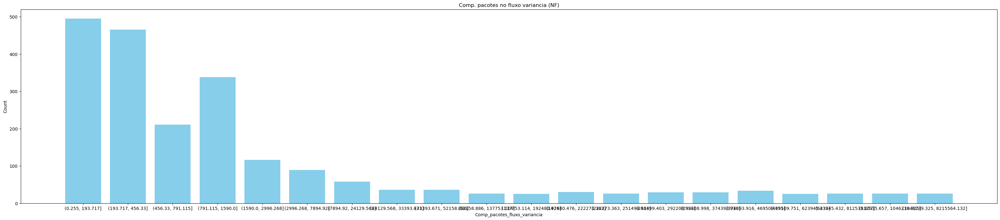

In [ ]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[49], ("Comp_pacotes_fluxo_variancia", "Count"), 1)
df_UNF 

analytic_data_std(normalFlow, columns[49], ("Comp_pacotes_fluxo_variancia","Count"), 20, 1, False, (40, 8), "Comp. pacotes no fluxo variancia (NF)", 1)

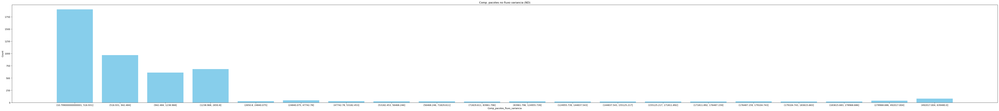

In [ ]:
# DDos Flow
df_UDF = get_df_unique(ddosFlow, columns[49], ("Comp_pacotes_fluxo_variancia", "Count"), 1)
df_UDF 

analytic_data_std(ddosFlow, columns[49], ("Comp_pacotes_fluxo_variancia","Count"), 20, 1, False, (80, 8), "Comp. pacotes no fluxo variancia (ND)", 1)

##### Contagem

###### FIN (Finalize) - Tag do protocolo TCP indicada para o encerramento de um conexão

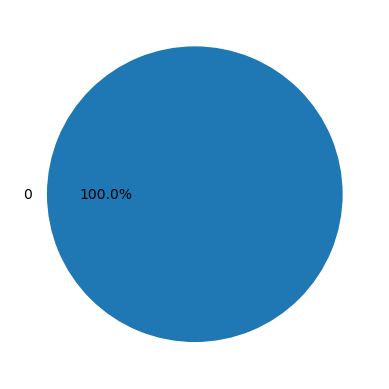

In [ ]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[50], ("Count_flag_FIN", "Count"), 1)
df_UNF
make_graph(2, df_UNF, "Count_flag_FIN", "Count", (8,6), "Count_flag_FIN")

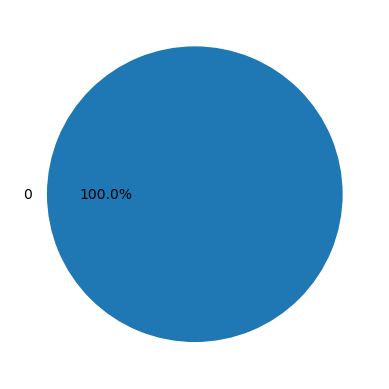

In [ ]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[50], ("Count_flag_FIN", "Count"), 1)
df_UDF
make_graph(2, df_UDF, "Count_flag_FIN", "Count", (8,6), "Count_flag_FIN")

###### SYN (Synchronize) - Tag usada para o início de uma conexão TCP

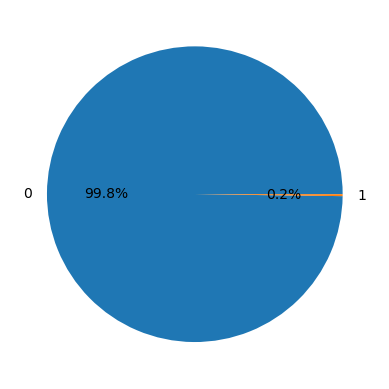

In [ ]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[51], ("Count_flag_SYN", "Count"), 1)
df_UNF
make_graph(2, df_UNF, "Count_flag_SYN", "Count", (8,6), "Count_flag_SYN")

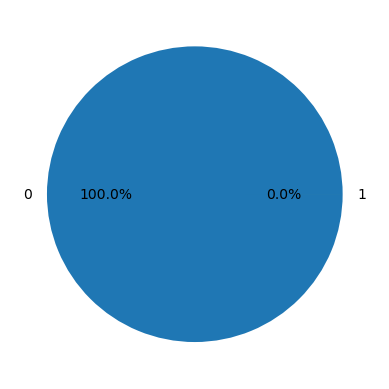

In [ ]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[51], ("Count_flag_SYN", "Count"), 1)
df_UDF
make_graph(2, df_UDF, "Count_flag_SYN", "Count", (8,6), "Count_flag_SYN")


###### RST (Reset) - Usada para encerrar imediatamente uma conexão, pode indicar que algo deu errado


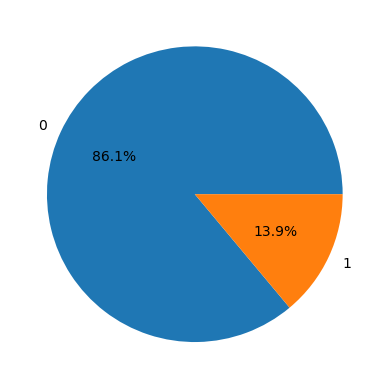

In [ ]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[52], ("Count_flag_RST", "Count"), 1)
df_UNF

make_graph(2, df_UNF, "Count_flag_RST", "Count", (8,6), "Count_flag_RST")

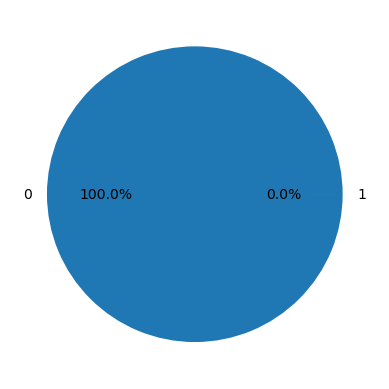

In [ ]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[52], ("Count_flag_RST", "Count"), 1)
df_UDF
make_graph(2, df_UDF, "Count_flag_RST", "Count", (8,6), "Count_flag_RST")


###### PSH (Push) - Indica que o receptor deve entregar o pacote direto na camada de aplicação (sem esperar que o buffer esteja cheio)

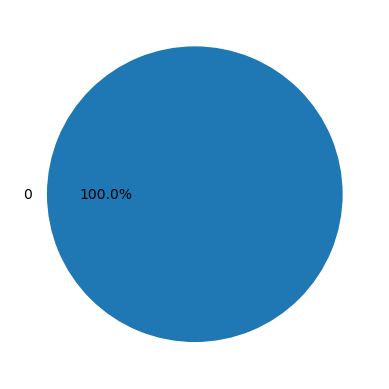

In [ ]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[53], ("Count_flag_PSH", "Count"), 1)
df_UNF
make_graph(2, df_UNF, "Count_flag_PSH", "Count", (8,6), "Count_flag_PSH")

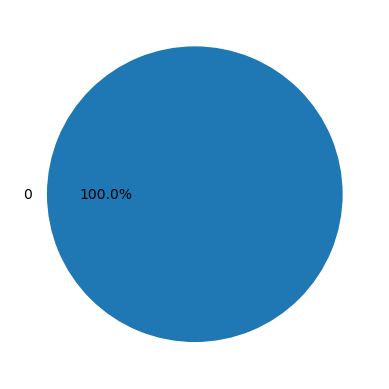

In [ ]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[53], ("Count_flag_PSH", "Count"), 1)
df_UDF
make_graph(2, df_UDF, "Count_flag_PSH", "Count", (8,6), "Count_flag_PSH")

###### ACK (Acknowledgment) - Pacote que confirma o recebimento de outro pacote

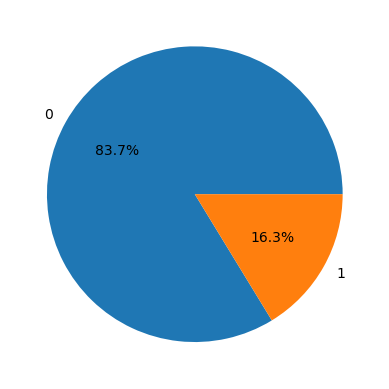

In [ ]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[54], ("Count_flag_ACK", "Count"), 1)
df_UNF
make_graph(2, df_UNF, "Count_flag_ACK", "Count", (8,6), "Count_flag_ACK")

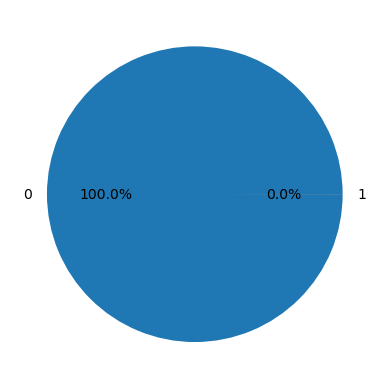

In [ ]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[54], ("Count_flag_ACK", "Count"), 1)
df_UDF
make_graph(2, df_UDF, "Count_flag_ACK", "Count", (8,6), "Count_flag_ACK")

###### URG (Urgent) - Indica urgencia em relação aos dados do pacote e devem ter prioridade de processamento pelo receptor

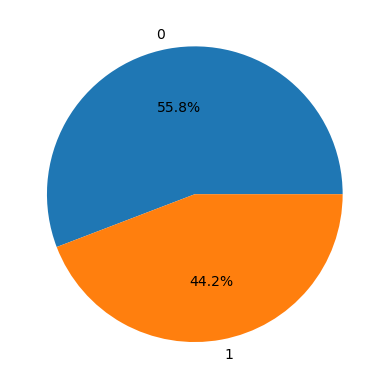

In [ ]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[55], ("Count_flag_URG", "Count"), 1)
df_UNF
make_graph(2, df_UNF, "Count_flag_URG", "Count", (8,6), "Count_flag_URG")

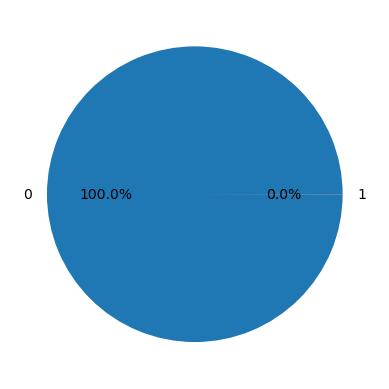

In [ ]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[55], ("Count_flag_URG", "Count"), 1)
df_UDF
make_graph(2, df_UDF, "Count_flag_URG", "Count", (8,6), "Count_flag_URG")

###### CWE - se refere a fraquezas de um software

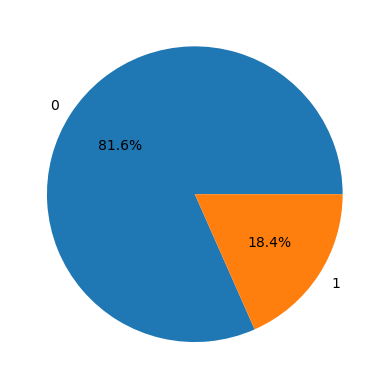

In [ ]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[56], ("Count_flag_CWE", "Count"))
df_UNF
make_graph(2, df_UNF, "Count_flag_CWE", "Count", (8,6), "Count_flag_CWE")

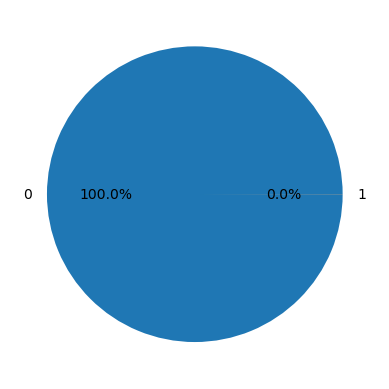

In [ ]:
# DDos Flow
df_UDF = get_df_unique(ddosFlow, columns[56], ("Count_flag_CWE","Count"))
df_UDF
make_graph(2, df_UDF, "Count_flag_CWE", "Count", (8,6), "Count_flag_CWE")

###### ECE (Explicit Congestion Notification) - Indica que o dispositivo de origem é compatível com a notificação explícita de congestionamento

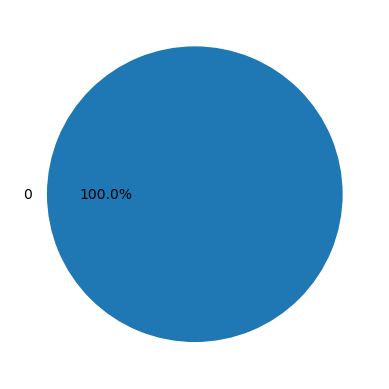

In [ ]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[57], ("Count_flag_ECE","Count"))
df_UNF
make_graph(2, df_UNF, "Count_flag_ECE", "Count", (8,6), "Count_flag_ECE")

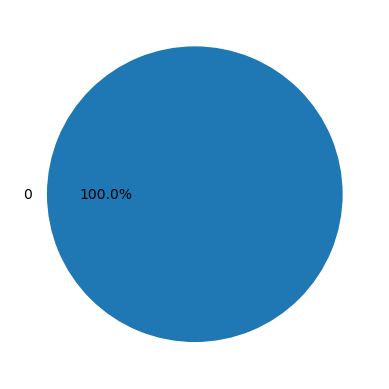

In [ ]:
# DDos Flow
df_UDF = get_df_unique(ddosFlow, columns[57], ("Count_flag_ECE","Count"))
df_UDF
make_graph(2, df_UDF, "Count_flag_ECE", "Count", (8,6), "Count_flag_ECE")

##### Razao entre tráfego de download/upload

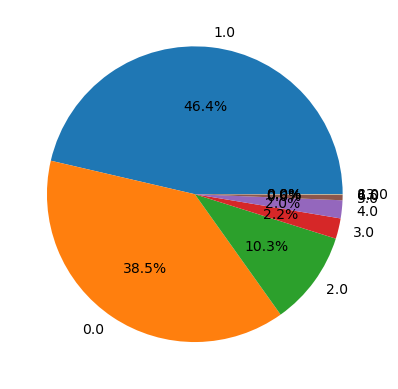

In [ ]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[58], ("razao_down_up","Count"))
# df_UNF
make_graph(2, df_UNF, "razao_down_up", "Count", (8,6), "razão download/upload")

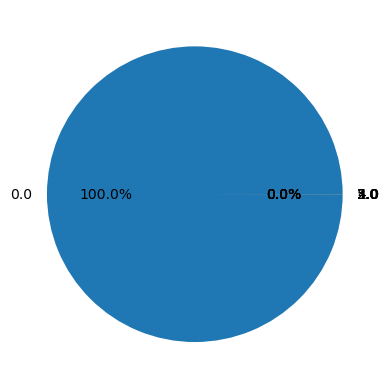

In [ ]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[58], ("razao_down_up","Count"))
# df_UDF
make_graph(2, df_UDF, "razao_down_up", "Count", (8,6), "razão download/upload")

##### Tamanho do pacote

###### tamanho médio do pacote 

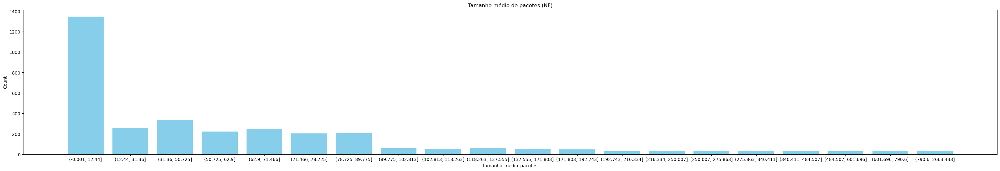

In [ ]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[59], ("Tamanho_medio_pacotes","Count"), 1)
df_UNF

analytic_data_std(normalFlow, columns[59], ("tamanho_medio_pacotes","Count"), 20, 1, False, (40,6), "Tamanho médio de pacotes (NF)", 0)

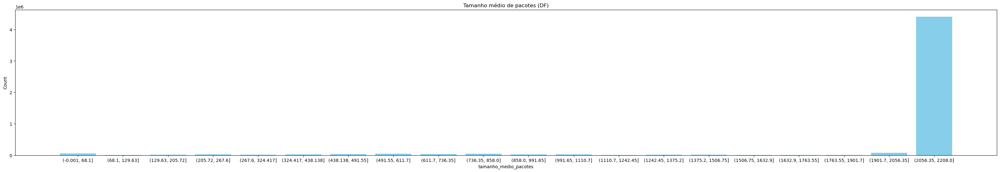

In [ ]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[59], ("Tamanho_medio_pacotes","Count"), 1)
df_UDF

analytic_data_std(ddosFlow, columns[59], ("tamanho_medio_pacotes","Count"), 20, 1, False, (40,6), "Tamanho médio de pacotes (DF)", 0)

In [135]:
# Gráfico da base completa 
df_final[columns[59]]

make_graph(3, df_final, columns[59], "Count", (20,6), "Tamanho médio dos pacotes", 0, 1000)

###### tamanho médio seg. direção ida

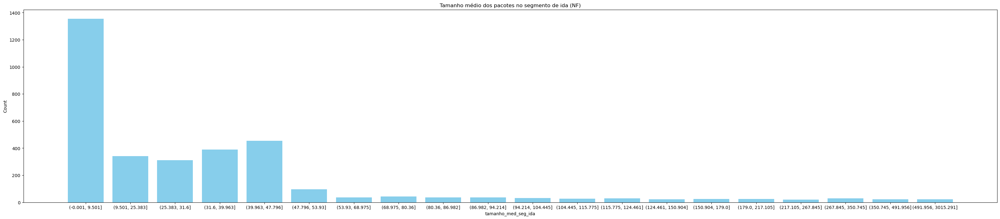

In [ ]:
# Normal flow
df_UNF = get_df_unique(normalFlow, columns[60], ("tamanho_med_seg_ida","Count"), 1)
df_UNF

analytic_data_std(normalFlow, columns[60], ("tamanho_med_seg_ida","Count"), 20, 1, False, (40,8), "Tamanho médio dos pacotes no segmento de ida (NF)", 0)

In [136]:
# DDoS flow
df_UDF = get_df_unique(ddosFlow, columns[60], ("tamanho_med_seg_ida","Count"), 0)
df_UDF

# analytic_data_std(ddosFlow, columns[60], ("tamanho_med_seg_ida","Count"), 20, 1, False, (40,8), "Tamanho médio dos pacotes no segmento de ida (DF)", 0)

,tamanho_med_seg_ida,Count
1698,1472.0,3643128
1697,1471.0,15
1696,1470.0,65
1695,1469.0,18
1694,1468.0,12
...,...,...
4,4.2,1
3,4.0,2
2,3.0,3
1,2.0,1


###### tamanho médio seg. direção volta

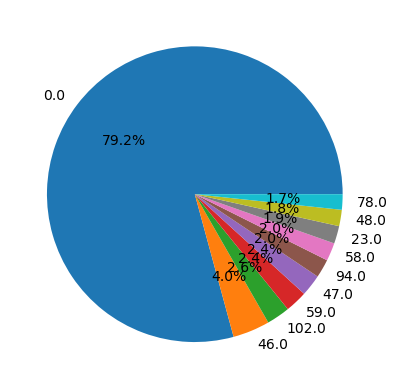

In [ ]:
# Normal flow
df_UNF = get_df_unique(normalFlow, columns[61], ("tamanho_med_seg_volta","Count"), 1)
df_UNF

make_graph(2, df_UNF.iloc[0:10,:], "tamanho_med_seg_volta", "Count", (8,6), "tamanho_med_seg_volta")

# analytic_data_std(normalFlow, columns[61], ("tamanho_med_seg_volta","Count"), 20, 1, False, (40,8), "Tamanho médio dos pacotes no segmento de volta (NF)", 0)

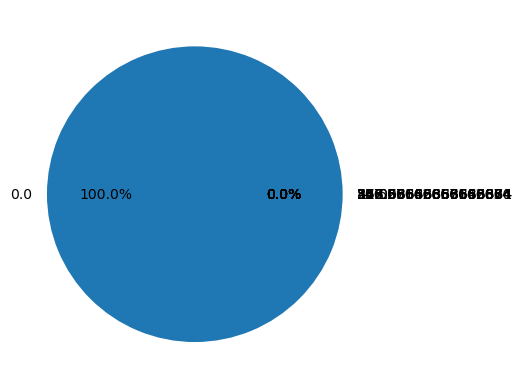

In [ ]:
# DDoS
df_UDF = get_df_unique(ddosFlow, columns[61], ("tamanho_med_seg_volta","Count"), 1)
df_UDF

make_graph(2, df_UDF.iloc[0:10,:], "tamanho_med_seg_volta", "Count", (8,6), "tamanho_med_seg_volta")

# analytic_data_std(ddosFlow, columns[61], ("tamanho_med_seg_volta","Count"), 20, 1, False, (40,8), "Tamanho médio dos pacotes no segmento de volta (DF)", 0)

##### Média de bytes por bulk

###### ida

In [ ]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[63], ("media_bytes_p_bulk", "Count"), 1)
df_UNF

,media_bytes_p_bulk,Count
0,0,3354


In [ ]:
# Normal Flow
df_UDF = get_df_unique(ddosFlow, columns[63], ("media_bytes_p_bulk", "Count"), 1)
df_UDF

,media_bytes_p_bulk,Count
0,0,4908665


###### volta

In [ ]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[66], ("media_bytes_p_bulk", "Count"), 1)
df_UNF

,media_bytes_p_bulk,Count
0,0,3354


In [ ]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[66], ("media_bytes_p_bulk", "Count"), 1)
df_UDF

,media_bytes_p_bulk,Count
0,0,4908665


##### Media de pacotes por bulk

###### ida

In [ ]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[64], ("media_pacotes_p_bulk", "Count"), 1)
df_UNF

,media_pacotes_p_bulk,Count
0,0,3354


In [ ]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[64], ("media_pacotes_p_bulk", "Count"), 1)
df_UDF

,media_bytes_p_bulk,Count
0,0,4908665


###### volta

In [ ]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[67], ("media_pacotes_p_bulk", "Count"), 1)
df_UNF

,media_pacotes_p_bulk,Count
0,0,3354


In [ ]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[67], ("media_pacotes_p_bulk", "Count"), 1)
df_UDF

,media_pacotes_p_bulk,Count
0,0,4908665


##### Taxa média de quantidade de bulks

###### ida

In [ ]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[64], ("taxa_media_de_bulks", "Count"), 1)
df_UNF

,taxa_media_de_bulks,Count
0,0,3354


In [ ]:
# DDoS Flow
df_UNF = get_df_unique(ddosFlow, columns[64], ("taxa_media_de_bulks", "Count"), 1)
df_UNF

,taxa_media_de_bulks,Count
0,0,4908665


###### volta

In [ ]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[68], ("taxa_media_de_bulks", "Count"), 1)
df_UNF

,taxa_media_de_bulks,Count
0,0,3354


In [ ]:
# DDoS Flow
df_UNF = get_df_unique(ddosFlow, columns[68], ("taxa_media_de_bulks", "Count"), 1)
df_UNF

,taxa_media_de_bulks,Count
0,0,4908665


##### Subfluxo

##### Número de pacotes no subfluxo

###### Ida

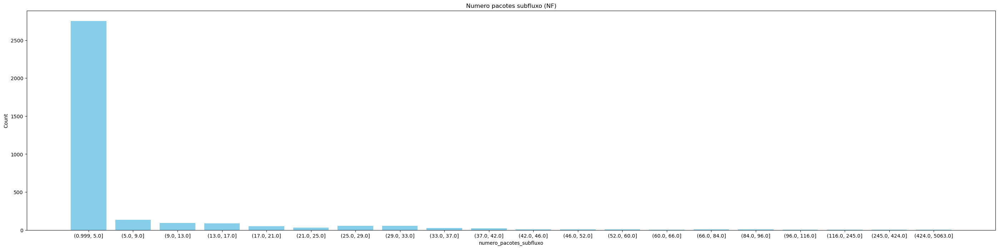

In [ ]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[69], ("numero_pacotes_subfluxo","Count"), 1)
df_UNF

analytic_data_std(normalFlow, columns[69], ("numero_pacotes_subfluxo","Count"), 20, 1, False, (35,8), "Numero pacotes subfluxo ida (NF)")

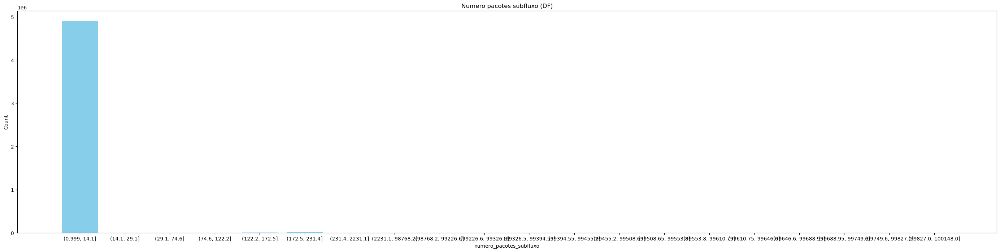

In [ ]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[69], ("numero_pacotes_subfluxo","Count"), 1)
df_UDF

analytic_data_std(ddosFlow, columns[69], ("numero_pacotes_subfluxo","Count"), 20, 1, False, (35,8), "Numero pacotes subfluxo ida (DF)", 0)

###### volta

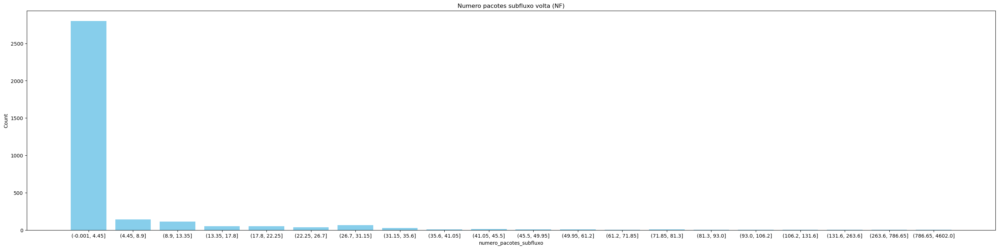

In [ ]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[71], ("numero_pacotes_subfluxo","Count"), 1)
df_UNF

analytic_data_std(normalFlow, columns[71], ("numero_pacotes_subfluxo","Count"), 20, 1, False, (35,8), "Numero pacotes subfluxo volta (NF)", 0)

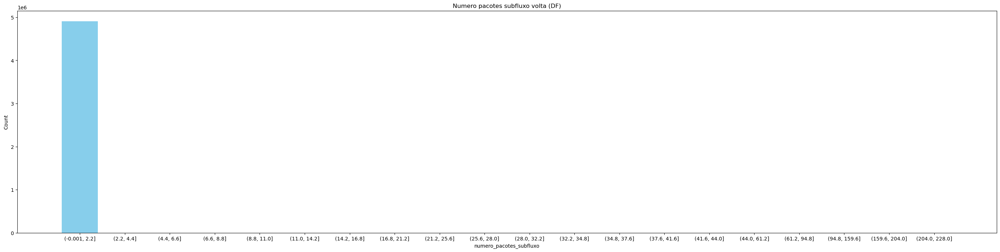

In [ ]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[71], ("numero_pacotes_subfluxo","Count"), 1)
df_UDF

analytic_data_std(ddosFlow, columns[71], ("numero_pacotes_subfluxo","Count"), 20, 1, False, (35,8), "Numero pacotes subfluxo volta (DF)", 0)


##### Bytes do subfluxo

###### ida

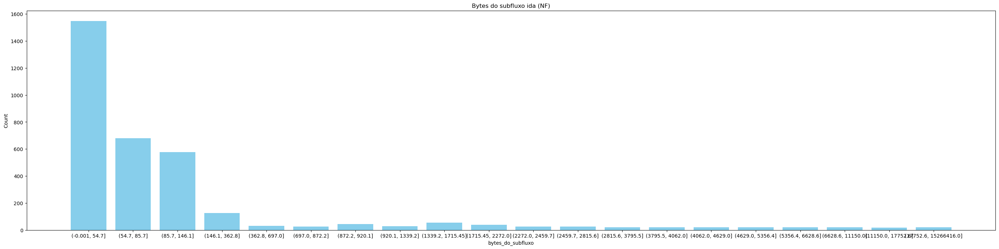

In [ ]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[70], ("bytes_do_subfluxo","Count"), 1)
df_UNF

analytic_data_std(normalFlow, columns[70], ("bytes_do_subfluxo","Count"), 20, 1, False, (35,8), "Bytes do subfluxo ida (NF)", 0)

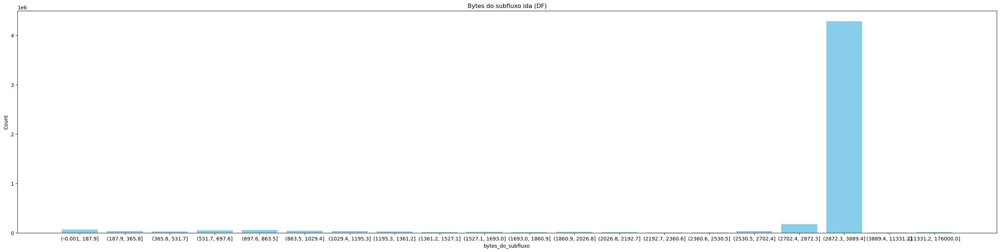

In [ ]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[70], ("bytes_do_subfluxo","Count"), 1)
df_UDF

analytic_data_std(ddosFlow, columns[70], ("bytes_do_subfluxo","Count"), 20, 1, False, (35,8), "Bytes do subfluxo ida (DF)", 0)

###### volta

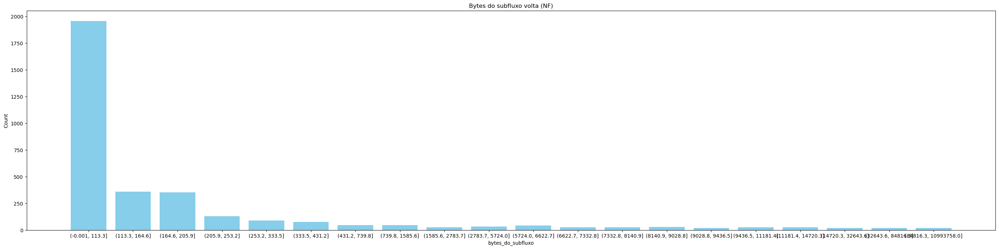

In [ ]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[72], ("bytes_do_subfluxo","Count"), 1)
df_UNF

analytic_data_std(normalFlow, columns[72], ("bytes_do_subfluxo","Count"), 20, 1, False, (35,8), "Bytes do subfluxo volta (NF)", 0)

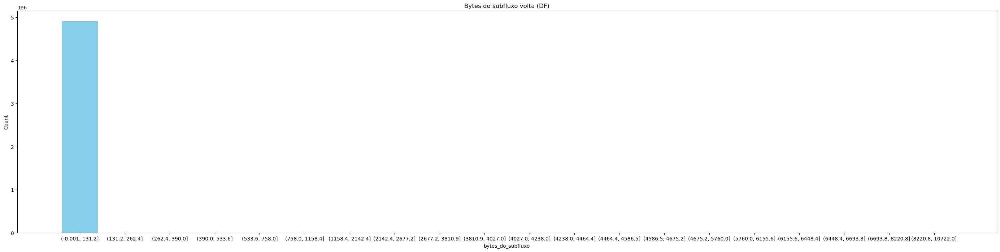

In [ ]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[72], ("bytes_do_subfluxo","Count"), 1)
df_UDF

analytic_data_std(ddosFlow, columns[72], ("bytes_do_subfluxo","Count"), 20, 1, False, (35,8), "Bytes do subfluxo volta (DF)", 0)

##### Tamanho da Janela inicial

###### Ida

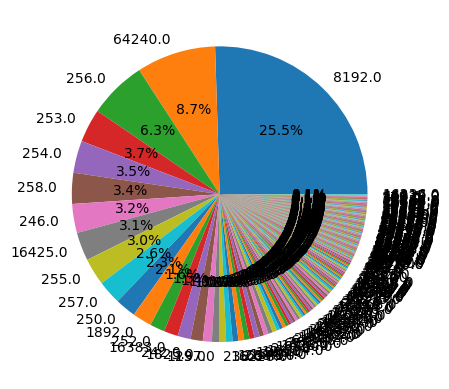

In [ ]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[73], ("tamanho_da_janela_inicial","Count"), 1)
df_UNF

make_graph(2, df_UNF, "tamanho_da_janela_inicial", "Count", (8,6), "tamanho da Janela Inicial")

# analytic_data_std(normalFlow, columns[73], ("tamanho_da_janela_inicial","Count"), 20, 1, False, (35,8), "Tamanho da janela inicial ida (NF)", 0)

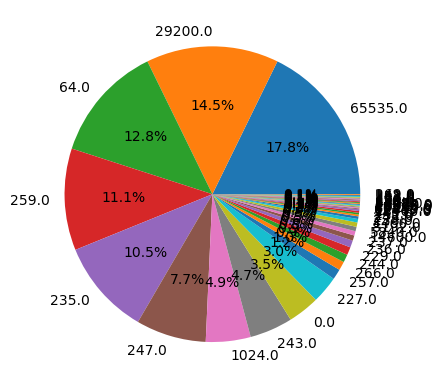

In [ ]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[73], ("tamanho_da_janela_inicial","Count"), 1)
df_UDF


make_graph(2, df_UDF, "tamanho_da_janela_inicial", "Count", (8,6), "tamanho da Janela Inicial")

# analytic_data_std(ddosFlow, columns[73], ("tamanho_da_janela_inicial","Count"), 20, 1, False, (35,8), "tamanho da Janela Inicial ida (DF)", 0)

###### volta

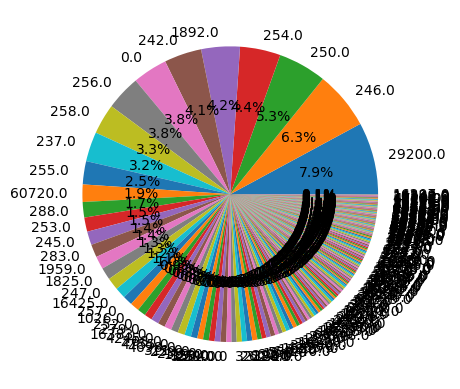

In [ ]:
# Normal Flow
df_UNF = get_df_unique(normalFlow, columns[74], ("tamanho_da_janela_inicial","Count"), 1)
df_UNF

make_graph(2, df_UNF, "tamanho_da_janela_inicial", "Count", (8,6), "tamanho da Janela Inicial")

# analytic_data_std(normalFlow, columns[74], ("tamanho_da_janela_inicial","Count"), 20, 1, False, (35,8), "Tamanho da janela inicial volta (NF)", 0)

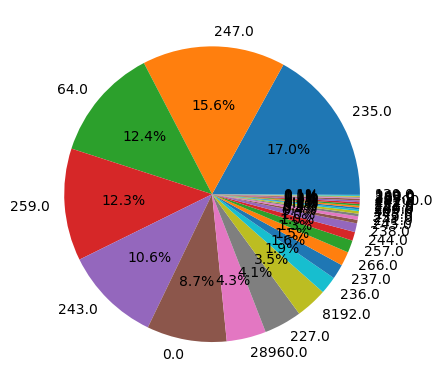

In [ ]:
# DDoS Flow
df_UDF = get_df_unique(ddosFlow, columns[74], ("tamanho_da_janela_inicial","Count"), 1)
df_UDF

make_graph(2, df_UDF, "tamanho_da_janela_inicial", "Count", (8,6), "tamanho da Janela Inicial")

# analytic_data_std(ddosFlow, columns[74], ("tamanho_da_janela_inicial","Count"), 20, 1, False, (35,8), "Tamanho da Janela Inicial volta (DF)", 0)

##### Pacotes de dados ativos na direção de ida

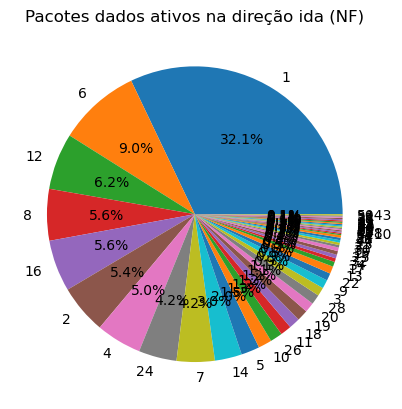

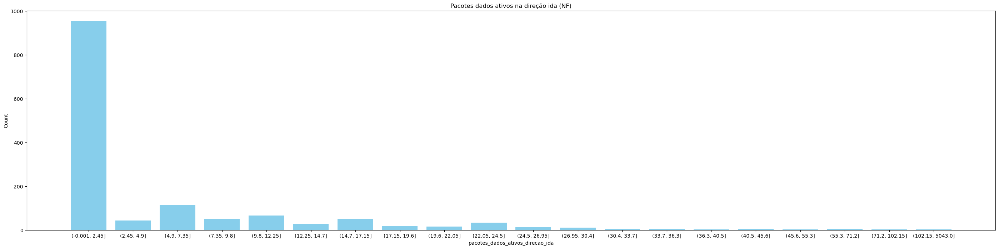

In [ ]:
# Normal flow

df_UNF = get_df_unique(normalFlow, columns[75], ("pacotes_dados_ativos_direcao_ida","Count"), 1)
df_UNF

make_graph(2, df_UNF.iloc[1:, :], "pacotes_dados_ativos_direcao_ida", "Count", (8,6), "Pacotes dados ativos na direção ida (NF)")

analytic_data_std(normalFlow, columns[75], ("pacotes_dados_ativos_direcao_ida","Count"), 20, 1, False, (35,8), "Pacotes dados ativos na direção ida (NF)", 0)

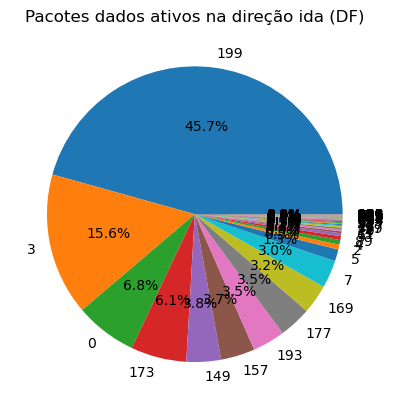

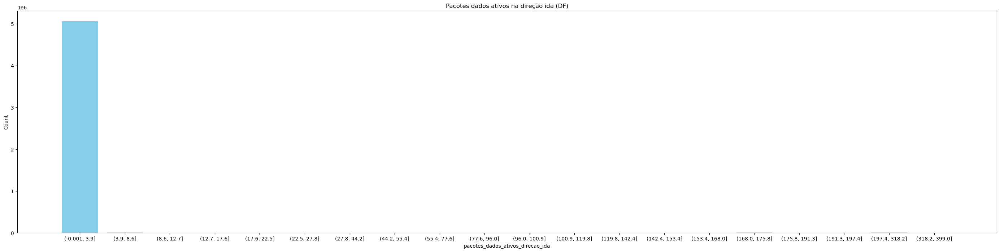

In [138]:
# Normal flow

df_UDF = get_df_unique(ddosFlow, columns[75], ("pacotes_dados_ativos_direcao_ida","Count"), 1)
df_UDF

make_graph(2, df_UDF.iloc[1:, :], "pacotes_dados_ativos_direcao_ida", "Count", (8,6), "Pacotes dados ativos na direção ida (DF)")

analytic_data_std(ddosFlow, columns[75], ("pacotes_dados_ativos_direcao_ida","Count"), 20, 1, False, (35,8), "Pacotes dados ativos na direção ida (DF)", 0)

##### Tamanho mínimo do segmento na direção de ida

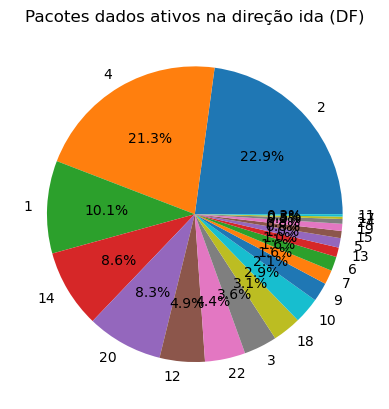

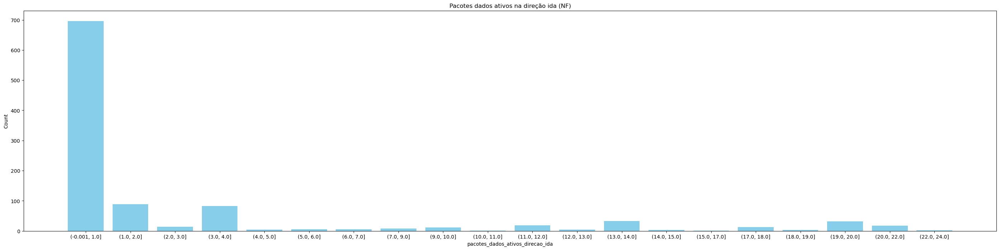

In [ ]:
# DDoS flow

df_UDF = get_df_unique(ddosFlow, columns[75], ("pacotes_dados_ativos_direcao_ida","Count"), 1)
df_UDF

make_graph(2, df_UDF.iloc[1:, :], "pacotes_dados_ativos_direcao_ida", "Count", (8,6), "Pacotes dados ativos na direção ida (DF)")

analytic_data_std(ddosFlow, columns[75], ("pacotes_dados_ativos_direcao_ida","Count"), 20, 1, False, (35,8), "Pacotes dados ativos na direção ida (NF)", 0)

##### Tamanho mínimo do segmentos na direção de ida

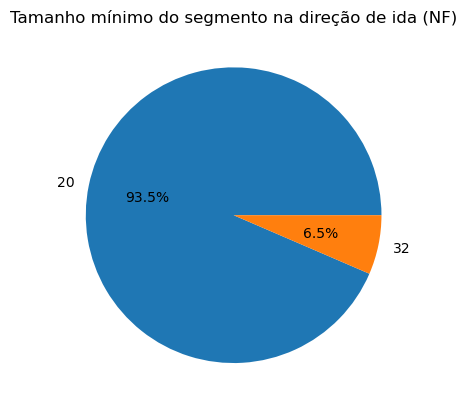

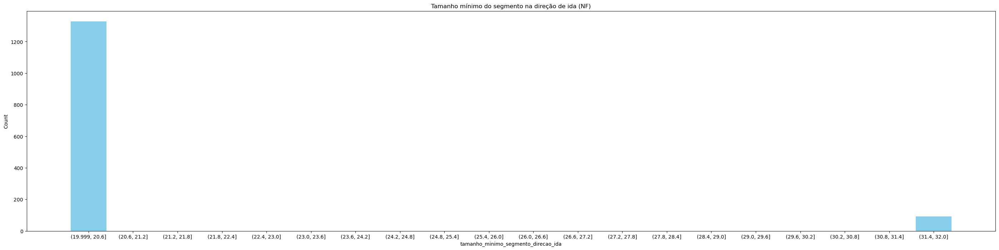

In [ ]:
# Normal flow

df_UNF = get_df_unique(normalFlow, columns[76], ("tamanho_minimo_segmento_direcao_ida","Count"), 1)
df_UNF

make_graph(2, df_UNF, "tamanho_minimo_segmento_direcao_ida", "Count", (8,6), "Tamanho mínimo do segmento na direção de ida (NF)")

analytic_data_std(normalFlow, columns[76], ("tamanho_minimo_segmento_direcao_ida","Count"), 20, 1, False, (35,8), "Tamanho mínimo do segmento na direção de ida (NF)", 0)

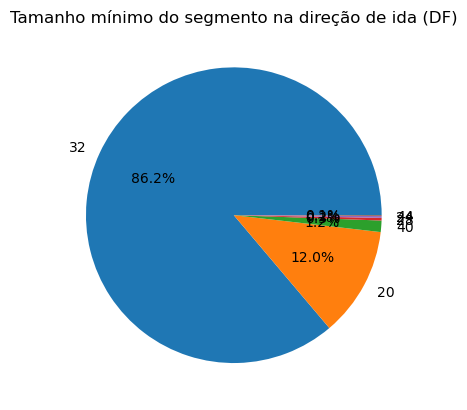

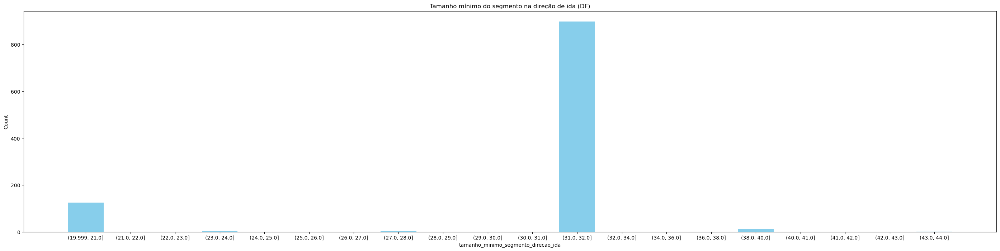

In [ ]:
# DDoS flow

df_UDF = get_df_unique(ddosFlow, columns[76], ("tamanho_minimo_segmento_direcao_ida","Count"), 1)
df_UDF

make_graph(2, df_UDF, "tamanho_minimo_segmento_direcao_ida", "Count", (8,6), "Tamanho mínimo do segmento na direção de ida (DF)")

analytic_data_std(ddosFlow, columns[76], ("tamanho_minimo_segmento_direcao_ida","Count"), 20, 1, False, (35,8), "Tamanho mínimo do segmento na direção de ida (DF)", 0)

##### Tempo de atividade

###### Médio

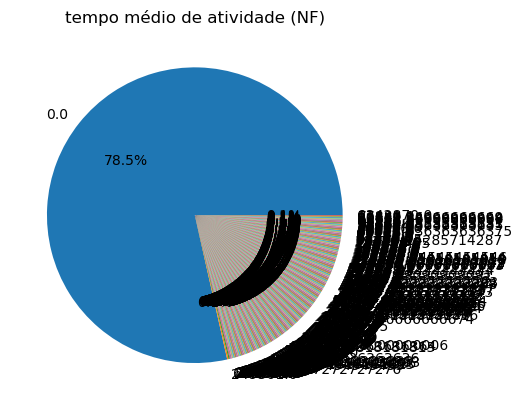

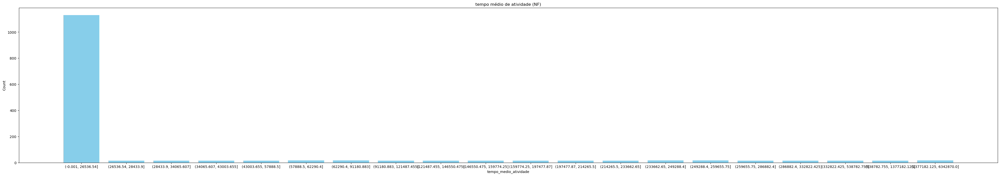

In [ ]:
# Normal flow

df_UNF = get_df_unique(normalFlow, columns[77], ("tempo_medio_atividade","Count"), 1)
df_UNF

make_graph(2, df_UNF, "tempo_medio_atividade", "Count", (8,6), "tempo médio de atividade (NF)")

analytic_data_std(normalFlow, columns[77], ("tempo_medio_atividade","Count"), 20, 1, False, (50,8), "tempo médio de atividade (NF)", 0)

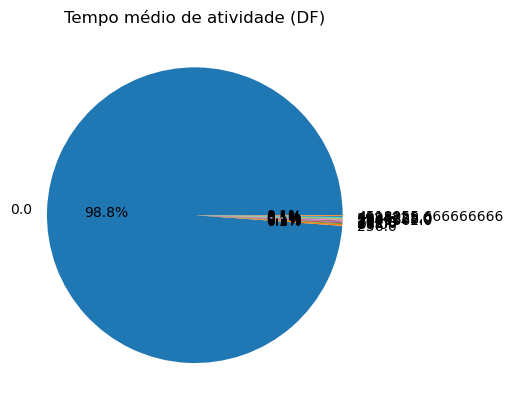

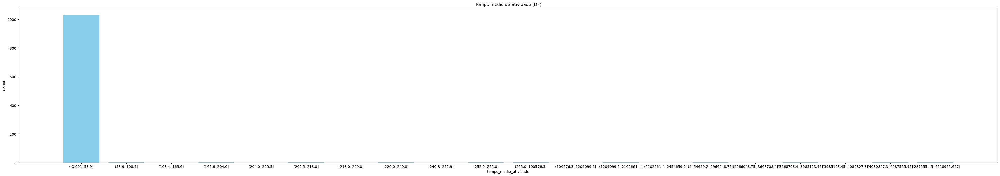

In [ ]:
# DDos flow

df_UDF = get_df_unique(ddosFlow, columns[77], ("tempo_medio_atividade","Count"), 1)
df_UDF

make_graph(2, df_UDF, "tempo_medio_atividade", "Count", (8,6), "Tempo médio de atividade (DF)")

analytic_data_std(ddosFlow, columns[77], ("tempo_medio_atividade","Count"), 20, 1, False, (50,8), "Tempo médio de atividade (DF)", 0)

###### Desvio padrão

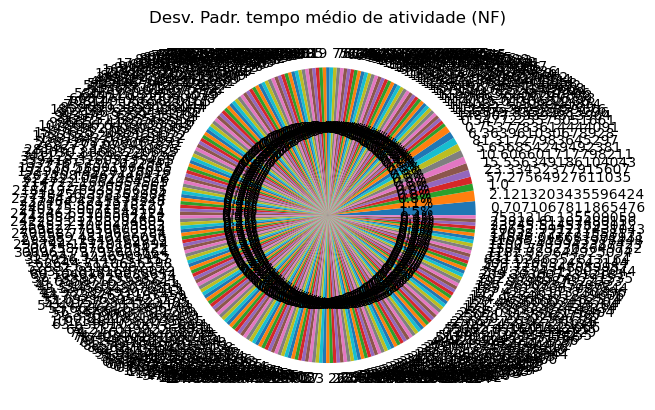

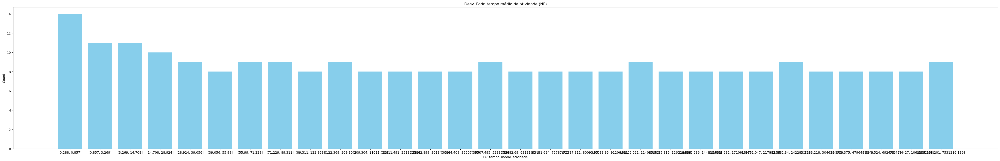

In [ ]:
# Normal flow
df_UNF = get_df_unique(normalFlow, columns[78], ("DP_tempo_medio_atividade","Count"), 1)
df_UNF

make_graph(2, df_UNF.iloc[1:, :], "DP_tempo_medio_atividade", "Count", (8,6), "Desv. Padr. tempo médio de atividade (NF)")

analytic_data_std(normalFlow, columns[78], ("DP_tempo_medio_atividade","Count"), 30, 1, False, (55,8), "Desv. Padr. tempo médio de atividade (NF)", 1)

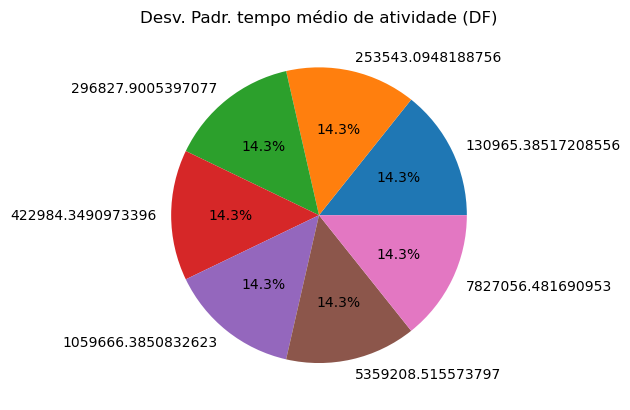

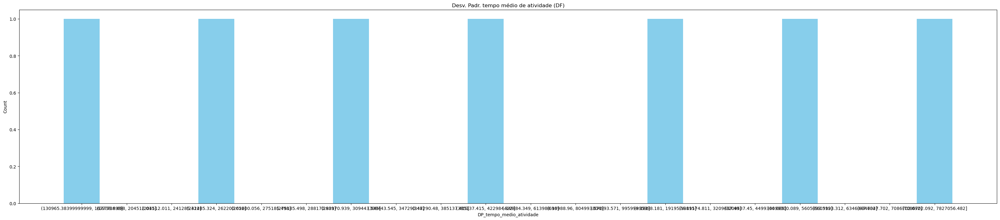

In [ ]:
# DDoS flow
df_UDF = get_df_unique(ddosFlow, columns[78], ("DP_tempo_medio_atividade","Count"), 1)
df_UDF

make_graph(2, df_UDF.iloc[1:, :], "DP_tempo_medio_atividade", "Count", (8,6), "Desv. Padr. tempo médio de atividade (DF)")

analytic_data_std(ddosFlow, columns[78], ("DP_tempo_medio_atividade","Count"), 20, 1, False, (40,8), "Desv. Padr. tempo médio de atividade (DF)", 1)

###### máximo

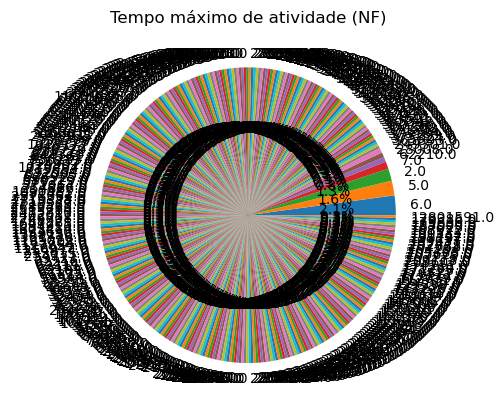

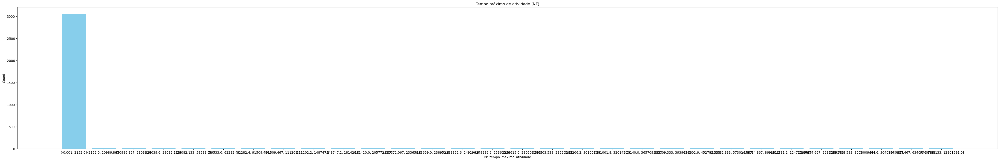

In [ ]:
# Normal flow
df_UNF = get_df_unique(normalFlow, columns[79], ("DP_tempo_maximo_atividade","Count"), 1)
df_UNF

make_graph(2, df_UNF.iloc[1:, :], "DP_tempo_maximo_atividade", "Count", (8,6), "Tempo máximo de atividade (NF)")

analytic_data_std(normalFlow, columns[79], ("DP_tempo_maximo_atividade","Count"), 30, 1, False, (55,8), "Tempo máximo de atividade (NF)", 0)

In [ ]:
# DDoS flow
df_UDF = get_df_unique(ddosFlow, columns[79], ("DP_tempo_maximo_atividade","Count"), 0)
df_UDF

# make_graph(2, df_UDF.iloc[1:, :], "DP_tempo_maximo_atividade", "Count", (8,6), "Tempo máximo de atividade (DF)")

# analytic_data_std(ddosFlow, columns[79], ("DP_tempo_maximo_atividade","Count"), 30, 1, False, (55,8), "Tempo máximo de atividade (DF)", 1)

,DP_tempo_maximo_atividade,Count
48,48722419.0,1
47,14513916.0,1
46,13556862.0,1
45,4915064.0,1
44,4459026.0,1
43,4098228.0,1
42,4024625.0,1
41,4024592.0,1
40,4024487.0,1
39,3924221.0,1


###### mínimo

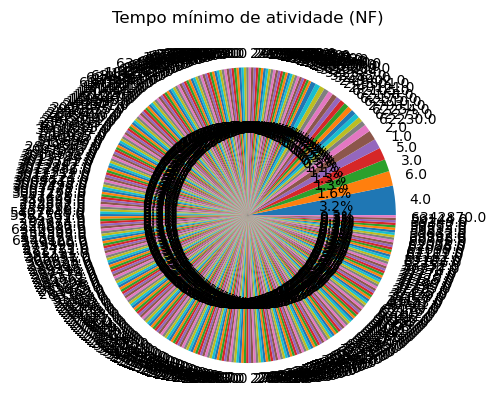

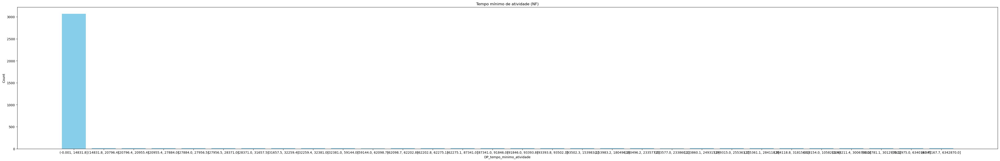

In [ ]:
# Normal flow
df_UNF = get_df_unique(normalFlow, columns[80], ("DP_tempo_minimo_atividade","Count"), 1)
df_UNF

make_graph(2, df_UNF.iloc[1:, :], "DP_tempo_minimo_atividade", "Count", (8,6), "Tempo mínimo de atividade (NF)")

analytic_data_std(normalFlow, columns[80], ("DP_tempo_minimo_atividade","Count"), 30, 1, False, (55,8), "Tempo mínimo de atividade (NF)", 0)

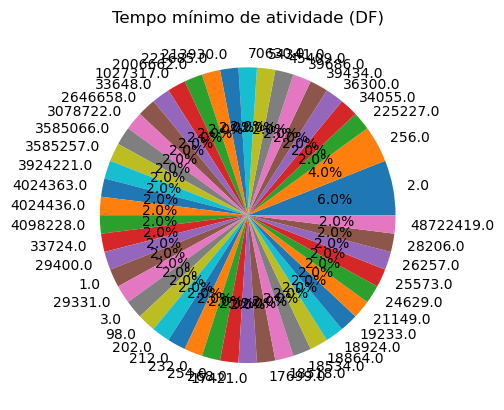

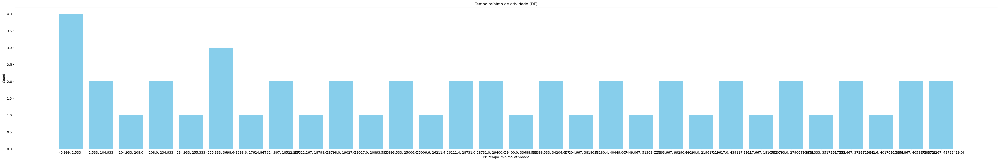

In [ ]:
# DDoS flow
df_UDF = get_df_unique(ddosFlow, columns[80], ("DP_tempo_minimo_atividade","Count"), 1)
df_UDF

make_graph(2, df_UDF.iloc[1:, :], "DP_tempo_minimo_atividade", "Count", (8,6), "Tempo mínimo de atividade (DF)")

analytic_data_std(ddosFlow, columns[80], ("DP_tempo_minimo_atividade","Count"), 30, 1, False, (55,8), "Tempo mínimo de atividade (DF)", 1)

###### Verificar tempo de atividade dividido pelo IP

In [ ]:
max =  normalFlow.groupby(columns[1])[columns[80]].max().reset_index()
max[max.iloc[:, 1] > 0]

,Flow ID,Active Min
1,162.248.19.151-192.168.50.6-443-57056-6,28392.0
2,162.248.19.151-192.168.50.6-443-57057-6,28286.0
3,162.248.19.151-192.168.50.6-443-57115-6,143295.0
5,172.217.0.102-192.168.50.8-443-59144-6,233587.0
6,172.217.0.102-192.168.50.8-443-59146-6,254508.0
...,...,...
1621,192.168.50.8-74.208.236.171-59223-80-6,411895.0
1676,192.168.50.8-96.6.27.46-59153-443-6,28828.0
1677,192.168.50.8-96.6.27.46-59154-443-6,28836.0
1683,255.255.255.255-0.0.0.0-67-68-17,5982561.0


In [ ]:
min =  normalFlow.groupby(columns[1])[columns[79]].max().reset_index()
min[min.iloc[:, 1] > 0]

,Flow ID,Active Max
1,162.248.19.151-192.168.50.6-443-57056-6,155485.0
2,162.248.19.151-192.168.50.6-443-57057-6,145601.0
3,162.248.19.151-192.168.50.6-443-57115-6,143295.0
5,172.217.0.102-192.168.50.8-443-59144-6,233668.0
6,172.217.0.102-192.168.50.8-443-59146-6,254771.0
...,...,...
1621,192.168.50.8-74.208.236.171-59223-80-6,411895.0
1676,192.168.50.8-96.6.27.46-59153-443-6,244626.0
1677,192.168.50.8-96.6.27.46-59154-443-6,5163615.0
1683,255.255.255.255-0.0.0.0-67-68-17,12801591.0


In [ ]:
med =  normalFlow.groupby(columns[1])[columns[77]].max().reset_index()
med[med.iloc[:, 1] > 0] 

,Flow ID,Active Mean
1,162.248.19.151-192.168.50.6-443-57056-6,4.429175e+04
2,162.248.19.151-192.168.50.6-443-57057-6,4.298125e+04
3,162.248.19.151-192.168.50.6-443-57115-6,1.432950e+05
5,172.217.0.102-192.168.50.8-443-59144-6,2.336275e+05
6,172.217.0.102-192.168.50.8-443-59146-6,2.546395e+05
...,...,...
1621,192.168.50.8-74.208.236.171-59223-80-6,4.118950e+05
1676,192.168.50.8-96.6.27.46-59153-443-6,8.245225e+04
1677,192.168.50.8-96.6.27.46-59154-443-6,5.347922e+05
1683,255.255.255.255-0.0.0.0-67-68-17,9.218128e+06


In [ ]:
verify = normalFlow[normalFlow[columns[1]] == "162.248.19.151-192.168.50.6-443-57056-6"]
verify[[columns[1],columns[77], columns[7]]]

,Flow ID,Active Mean,Timestamp
10771,162.248.19.151-192.168.50.6-443-57056-6,44291.75,2018-12-01 10:59:04.113123
12877,162.248.19.151-192.168.50.6-443-57056-6,28471.00,2018-12-01 11:00:34.493232
13441,162.248.19.151-192.168.50.6-443-57056-6,0.00,2018-12-01 11:00:59.761421
13449,162.248.19.151-192.168.50.6-443-57056-6,0.00,2018-12-01 11:00:59.789900
13450,162.248.19.151-192.168.50.6-443-57056-6,0.00,2018-12-01 11:00:59.789904
13463,162.248.19.151-192.168.50.6-443-57056-6,0.00,2018-12-01 11:01:00.289547


##### Tempo de inatividade

###### Máximo

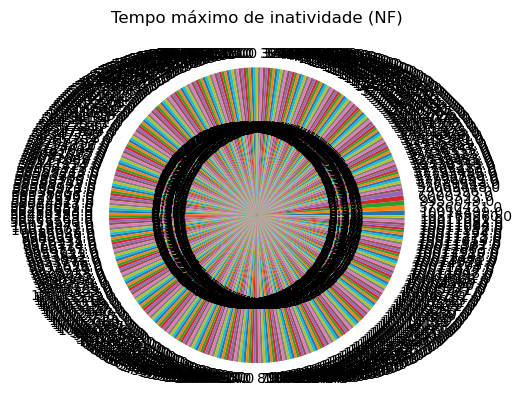

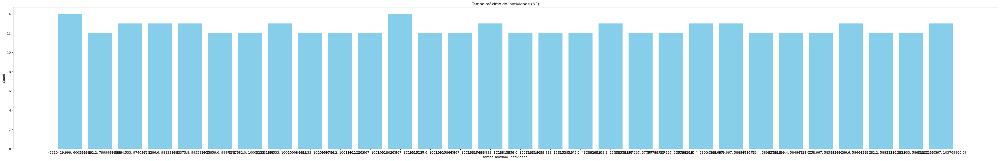

In [ ]:
# NormalFlow flow
df_UNF = get_df_unique(normalFlow, columns[83], ("tempo_maximo_inatividade","Count"), 1)
df_UNF

make_graph(2, df_UNF.iloc[1:, :], "tempo_maximo_inatividade", "Count", (8,6), "Tempo máximo de inatividade (NF)")

analytic_data_std(normalFlow, columns[83], ("tempo_maximo_inatividade","Count"), 30, 1, False, (55,8), "Tempo máximo de inatividade (NF)", 1)

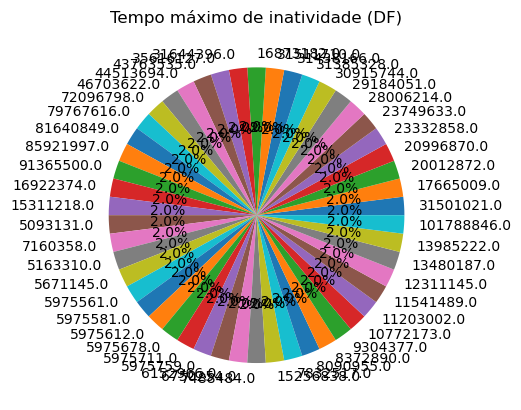

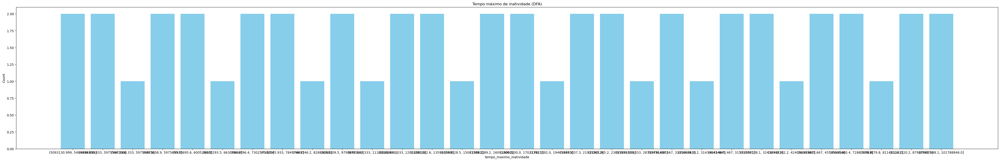

In [ ]:
# DDoS flow
df_UDF = get_df_unique(ddosFlow, columns[83], ("tempo_maximo_inatividade","Count"), 1)
df_UDF

make_graph(2, df_UDF.iloc[1:, :], "tempo_maximo_inatividade", "Count", (8,6), "Tempo máximo de inatividade (DF)")

analytic_data_std(ddosFlow, columns[83], ("tempo_maximo_inatividade","Count"), 30, 1, False, (55,8), "Tempo máximo de inatividade (DFA)", 1)

###### Médio

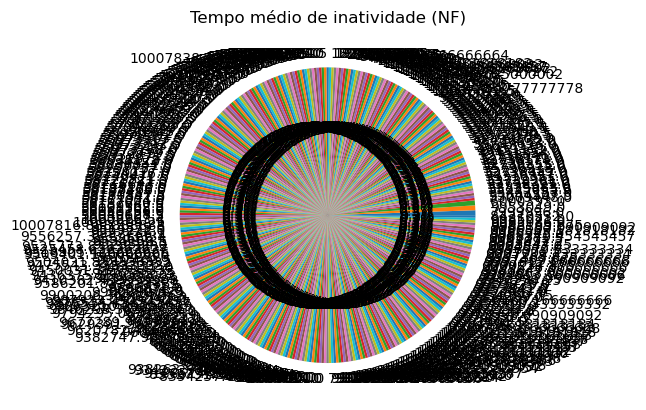

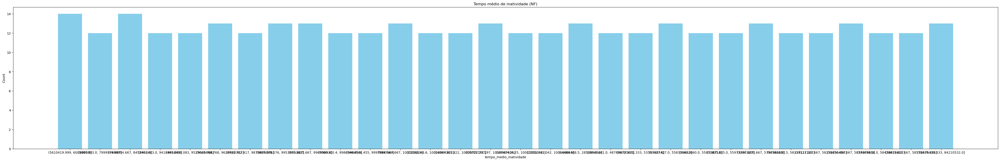

In [ ]:
# NormalFlow flow
df_UNF = get_df_unique(normalFlow, columns[81], ("tempo_medio_inatividade","Count"), 1)
df_UNF

make_graph(2, df_UNF.iloc[1:, :], "tempo_medio_inatividade", "Count", (8,6), "Tempo médio de inatividade (NF)")

analytic_data_std(normalFlow, columns[81], ("tempo_medio_inatividade","Count"), 30, 1, False, (55,8), "Tempo médio de inatividade (NF)", 1)

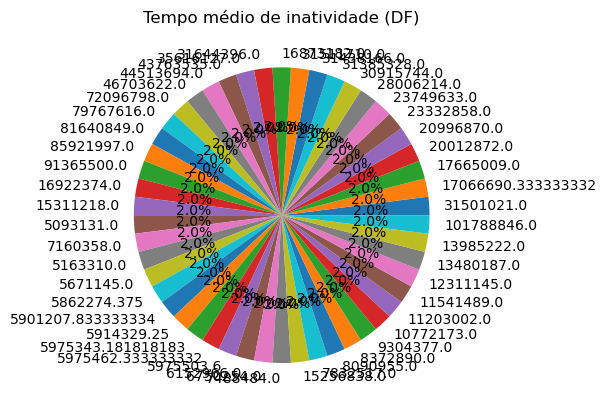

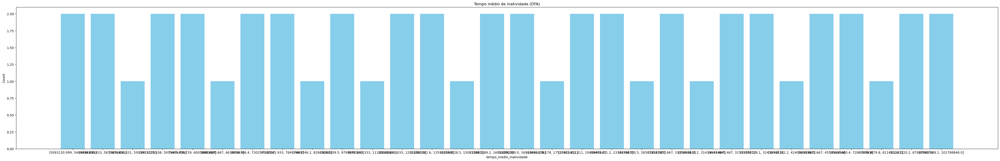

In [ ]:
# DDoS flow
df_UDF = get_df_unique(ddosFlow, columns[81], ("tempo_medio_inatividade","Count"), 1)
df_UDF

make_graph(2, df_UDF.iloc[1:, :], "tempo_medio_inatividade", "Count", (8,6), "Tempo médio de inatividade (DF)")

analytic_data_std(ddosFlow, columns[81], ("tempo_medio_inatividade","Count"), 30, 1, False, (55,8), "Tempo médio de inatividade (DFA)", 1)

###### Mínimo

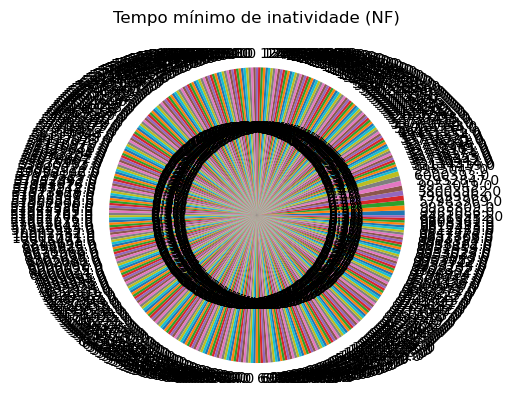

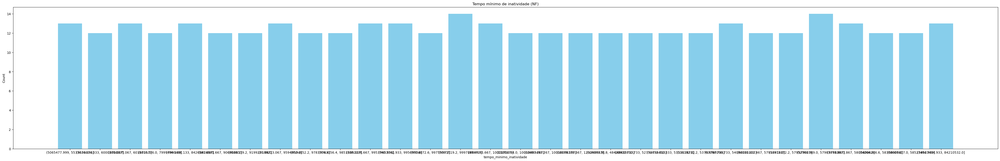

In [ ]:
# NormalFlow flow
df_UNF = get_df_unique(normalFlow, columns[84], ("tempo_minimo_inatividade","Count"), 1)
df_UNF

make_graph(2, df_UNF.iloc[1:, :], "tempo_minimo_inatividade", "Count", (8,6), "Tempo mínimo de inatividade (NF)")

analytic_data_std(normalFlow, columns[84], ("tempo_minimo_inatividade","Count"), 30, 1, False, (55,8), "Tempo mínimo de inatividade (NF)", 1)

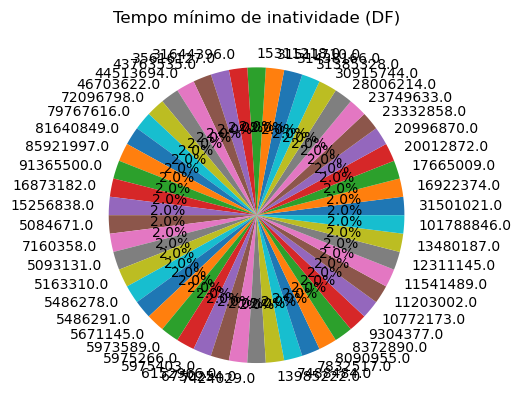

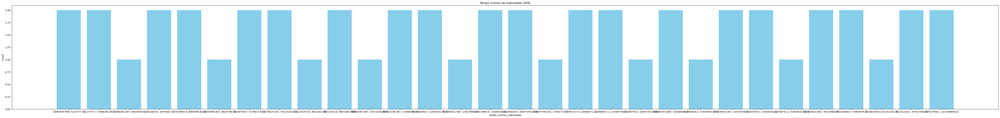

In [ ]:
# DDoS flow
df_UDF = get_df_unique(ddosFlow, columns[84], ("tempo_minimo_inatividade","Count"), 1)
df_UDF

make_graph(2, df_UDF.iloc[1:, :], "tempo_minimo_inatividade", "Count", (8,6), "Tempo mínimo de inatividade (DF)")

analytic_data_std(ddosFlow, columns[84], ("tempo_minimo_inatividade","Count"), 30, 1, False, (75,8), "Tempo mínimo de inatividade (DFA)", 1)

###### Desvio padrão

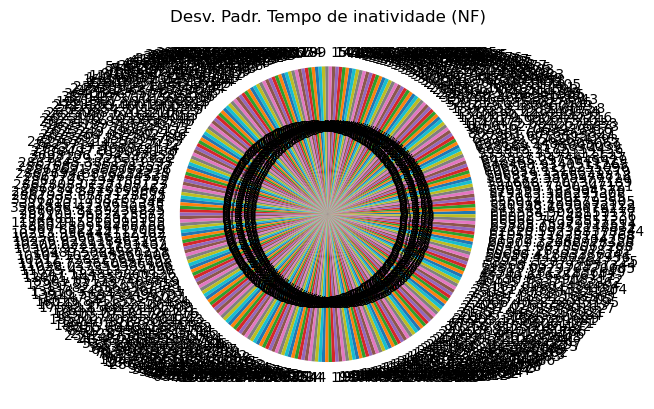

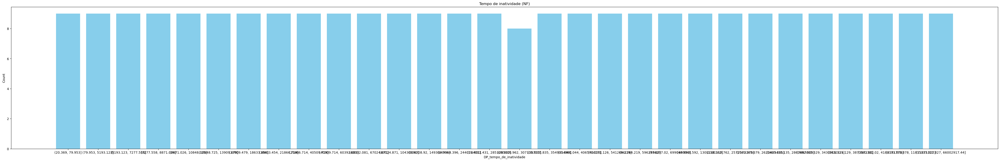

In [ ]:
# NormalFlow flow
df_UNF = get_df_unique(normalFlow, columns[82], ("DP_tempo_de_inatividade","Count"), 1)
df_UNF

make_graph(2, df_UNF.iloc[1:, :], "DP_tempo_de_inatividade", "Count", (8,6), "Desv. Padr. Tempo de inatividade (NF)")

analytic_data_std(normalFlow, columns[82], ("DP_tempo_de_inatividade","Count"), 30, 1, False, (55,8), "Tempo de inatividade (NF)", 1)

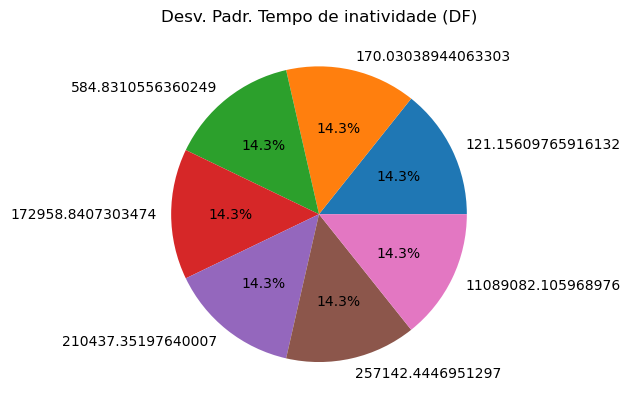

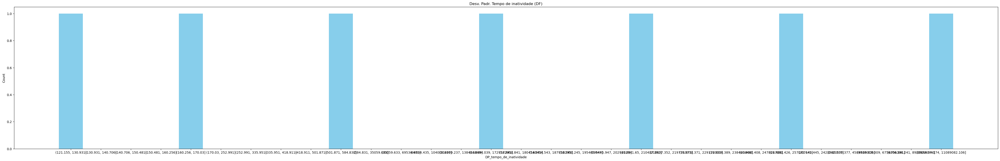

In [ ]:
# DDoS flow
df_UDF = get_df_unique(ddosFlow, columns[82], ("DP_tempo_de_inatividade","Count"), 1)
df_UDF

make_graph(2, df_UDF.iloc[1:, :], "DP_tempo_de_inatividade", "Count", (8,6), "Desv. Padr. Tempo de inatividade (DF)")

analytic_data_std(ddosFlow, columns[82], ("DP_tempo_de_inatividade","Count"), 30, 1, False, (55,8), "Desv. Padr. Tempo de inatividade (DF)", 1)

##### Similaridade com tráfego HTTP

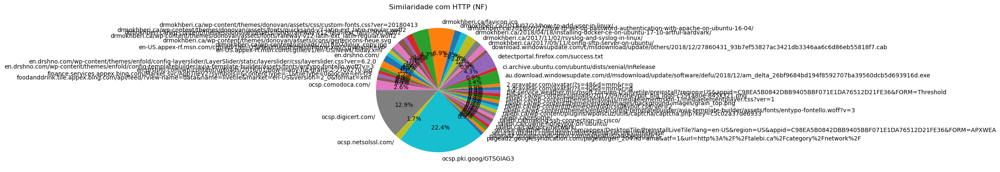

In [ ]:
# NormalFlow

uniqueDf_t = [content for content in normalFlow[columns[85]]]

uniqueDf = np.unique(uniqueDf_t, return_counts=True)
df_unique = pd.DataFrame({columns[85]:uniqueDf[0], 'Count':uniqueDf[1]})
df_unique

make_graph(2, df_unique.iloc[1:, :], "SimillarHTTP", "Count", (8,6), "Similaridade com HTTP (NF)")

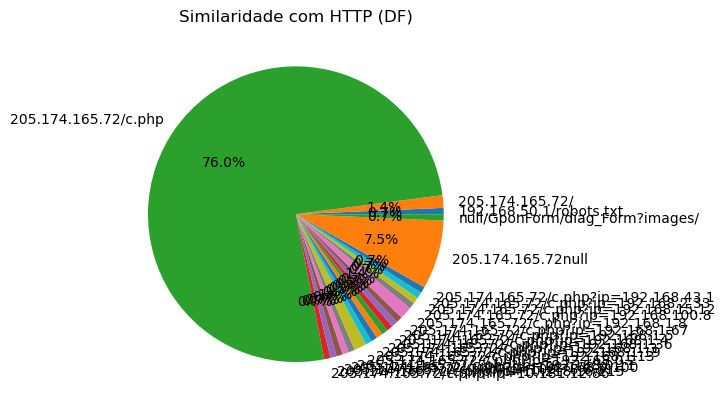

In [ ]:
# DDoS Flow

uniqueDf_t = [content for content in ddosFlow[columns[85]]]

uniqueDf = np.unique(uniqueDf_t, return_counts=True)
df_unique = pd.DataFrame({columns[85]:uniqueDf[0], 'Count':uniqueDf[1]})
df_unique

make_graph(2, df_unique.iloc[1:, :], "SimillarHTTP", "Count", (8,6), "Similaridade com HTTP (DF)")

##### Indicador de tráfego de entrada

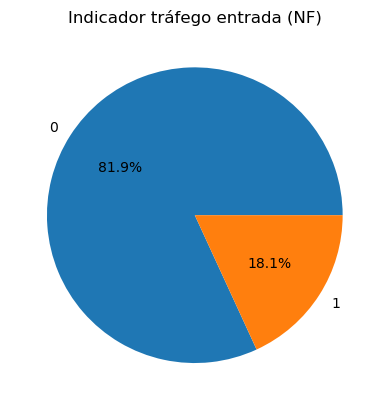

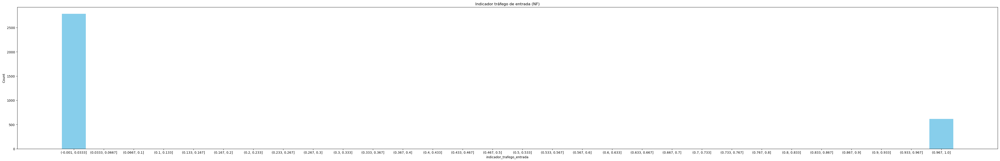

In [ ]:
# NormalFlow flow
df_UNF = get_df_unique(normalFlow, columns[86], ("indicador_trafego_entrada","Count"), 1)
df_UNF

make_graph(2, df_UNF, "indicador_trafego_entrada", "Count", (8,6), "Indicador tráfego entrada (NF)")
analytic_data_std(normalFlow, columns[86], ("indicador_trafego_entrada","Count"), 30, 1, False, (55,8), "Indicador tráfego de entrada (NF)", 0)

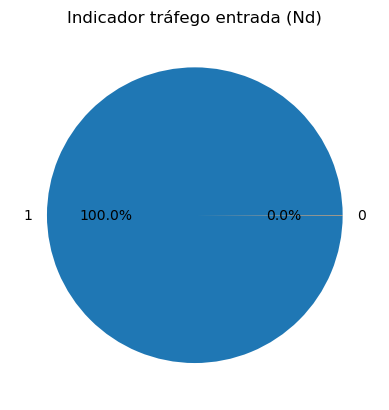

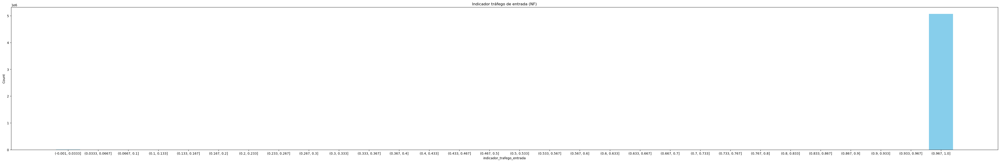

In [ ]:
# DDoS flow
df_UDF = get_df_unique(ddosFlow, columns[86], ("indicador_trafego_entrada","Count"), 1)
df_UDF

make_graph(2, df_UDF, "indicador_trafego_entrada", "Count", (8,6), "Indicador tráfego entrada (Nd)")
analytic_data_std(ddosFlow, columns[86], ("indicador_trafego_entrada","Count"), 30, 1, False, (55,8), "Indicador tráfego de entrada (DF)", 0)